<a href="https://colab.research.google.com/github/FJSD08/master-series-forecasting-notebook/blob/main/Forecasting_Dataset01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Importando bibliotecas
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.seasonal import seasonal_decompose


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
data = pd.read_excel('/content/drive/MyDrive/Mestrado/DataSet_PZs_ForquilhasV.xlsx')
data

,TIMESTAMP,PZE01,PZE03,PZE04,PZE05,PZE06,PZE07,PZE08,PZE09,PZE10,PZE11,PZE12,PZE13
0,2023-01-17 11:00:00,1.342951,-0.182565,0.029329,-0.030523,-0.413892,0.028997,0.186868,4.332498,3.278466,3.582648,2.035457,4.734820
1,2023-01-17 12:00:00,1.323022,-0.173670,0.030126,-0.032635,-0.420420,0.032528,0.180509,4.326719,3.275582,3.589416,2.039707,4.735727
2,2023-01-17 13:00:00,1.327751,-0.179015,0.043033,-0.037601,-0.430876,0.033393,0.177111,4.325400,3.275379,3.588884,2.035494,4.731488
3,2023-01-17 14:00:00,1.336536,-0.173631,0.042637,-0.028208,-0.422311,0.033751,0.182295,4.332095,3.275108,3.589302,2.035837,4.733491
4,2023-01-17 15:00:00,1.340861,-0.185186,0.039688,-0.033874,-0.421856,0.029028,0.179038,4.337240,3.274470,3.592537,2.034507,4.732096
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3949,2023-07-02 13:00:00,1.650003,-0.167794,0.032550,-0.034736,-0.541352,0.030934,0.172135,4.254673,3.188140,3.658848,2.013674,4.750950
3950,2023-07-02 14:00:00,1.650445,-0.169779,0.032408,-0.032878,-0.540463,0.030565,0.171855,4.255033,3.187416,3.657538,2.013823,4.752974
3951,2023-07-02 15:00:00,1.653503,-0.172255,0.032266,-0.031019,-0.539573,0.030115,0.171576,4.255394,3.186692,3.657295,2.013971,4.754998
3952,2023-07-02 16:00:00,1.656560,-0.174731,0.032124,-0.029161,-0.538684,0.029664,0.171296,4.255754,3.185967,3.657051,2.014120,4.757022


In [5]:
# Convertendo a coluna 'TIMESTAMP' para o formato datetime
data['TIMESTAMP'] = pd.to_datetime(data['TIMESTAMP'], format='%d/%m/%Y %H:%M')

# Definindo 'TIMESTAMP' como índice do DataFrame
data.set_index('TIMESTAMP', inplace=True)

In [6]:
# Supondo que 'data' é um DataFrame Pandas e 'target' é a coluna que você deseja prever
X = data.drop('PZE13', axis=1)  # Substitua 'target' pelo nome real da sua variável dependente
y = data['PZE13']  # Variável dependente

In [7]:
# Dividir os dados em treino e teste não é tão simples quanto uma divisão aleatória em dados temporais
# Walk-Forward Validation para séries temporais
n_train = int(len(X) * 0.8)
X_train, X_test = X[:n_train], X[n_train:]
y_train, y_test = y[:n_train], y[n_train:]

In [8]:
data

,PZE01,PZE03,PZE04,PZE05,PZE06,PZE07,PZE08,PZE09,PZE10,PZE11,PZE12,PZE13
TIMESTAMP,,,,,,,,,,,,
2023-01-17 11:00:00,1.342951,-0.182565,0.029329,-0.030523,-0.413892,0.028997,0.186868,4.332498,3.278466,3.582648,2.035457,4.734820
2023-01-17 12:00:00,1.323022,-0.173670,0.030126,-0.032635,-0.420420,0.032528,0.180509,4.326719,3.275582,3.589416,2.039707,4.735727
2023-01-17 13:00:00,1.327751,-0.179015,0.043033,-0.037601,-0.430876,0.033393,0.177111,4.325400,3.275379,3.588884,2.035494,4.731488
2023-01-17 14:00:00,1.336536,-0.173631,0.042637,-0.028208,-0.422311,0.033751,0.182295,4.332095,3.275108,3.589302,2.035837,4.733491
2023-01-17 15:00:00,1.340861,-0.185186,0.039688,-0.033874,-0.421856,0.029028,0.179038,4.337240,3.274470,3.592537,2.034507,4.732096
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-02 13:00:00,1.650003,-0.167794,0.032550,-0.034736,-0.541352,0.030934,0.172135,4.254673,3.188140,3.658848,2.013674,4.750950
2023-07-02 14:00:00,1.650445,-0.169779,0.032408,-0.032878,-0.540463,0.030565,0.171855,4.255033,3.187416,3.657538,2.013823,4.752974
2023-07-02 15:00:00,1.653503,-0.172255,0.032266,-0.031019,-0.539573,0.030115,0.171576,4.255394,3.186692,3.657295,2.013971,4.754998


In [9]:
data.describe()

,PZE01,PZE03,PZE04,PZE05,PZE06,PZE07,PZE08,PZE09,PZE10,PZE11,PZE12,PZE13
count,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000,3954.000000
mean,1.631642,-0.177859,0.092353,-0.030839,-0.491273,0.030633,0.174702,4.303773,3.247122,3.696368,2.031834,4.773888
std,0.154156,0.005296,0.061561,0.002960,0.034742,0.002461,0.006286,0.032316,0.036928,0.040562,0.016346,0.019318
min,1.264300,-0.197608,0.009378,-0.040345,-0.546427,0.019005,0.151760,4.246230,3.185243,3.582364,2.009047,4.718867
25%,1.671124,-0.181438,0.037346,-0.032794,-0.517377,0.029016,0.170389,4.278211,3.216255,3.673490,2.018467,4.759869
50%,1.702500,-0.178094,0.072895,-0.030830,-0.504614,0.030733,0.174020,4.296604,3.241746,3.697531,2.027993,4.773411
75%,1.721683,-0.174546,0.137276,-0.028814,-0.461236,0.032259,0.178642,4.328743,3.274981,3.721693,2.040524,4.787236
max,1.778515,-0.159945,0.250715,-0.017691,-0.406186,0.039634,0.200779,4.398793,3.342269,3.787807,2.102749,4.821586


In [10]:
# Calcular estatísticas descritivas para o DataFrame
descricao = data.describe()

# Especificar o caminho do arquivo Excel onde você deseja salvar os dados
caminho_do_arquivo_excel = '/content/drive/MyDrive/Mestrado/imagens/descricao_dataset01_pzs.xlsx'

# Salvar as estatísticas descritivas em um arquivo Excel
descricao.to_excel(caminho_do_arquivo_excel)

print("Estatísticas descritivas salvas com sucesso em", caminho_do_arquivo_excel)

Estatísticas descritivas salvas com sucesso em /content/drive/MyDrive/Mestrado/imagens/descricao_dataset01_pzs.xlsx


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3954 entries, 2023-01-17 11:00:00 to 2023-07-02 17:00:00
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PZE01   3954 non-null   float64
 1   PZE03   3954 non-null   float64
 2   PZE04   3954 non-null   float64
 3   PZE05   3954 non-null   float64
 4   PZE06   3954 non-null   float64
 5   PZE07   3954 non-null   float64
 6   PZE08   3954 non-null   float64
 7   PZE09   3954 non-null   float64
 8   PZE10   3954 non-null   float64
 9   PZE11   3954 non-null   float64
 10  PZE12   3954 non-null   float64
 11  PZE13   3954 non-null   float64
dtypes: float64(12)
memory usage: 401.6 KB


In [12]:
# Bibliotecas de visualização
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as po
from plotly.subplots import make_subplots
import plotly.tools as tls
import plotly.figure_factory as ff

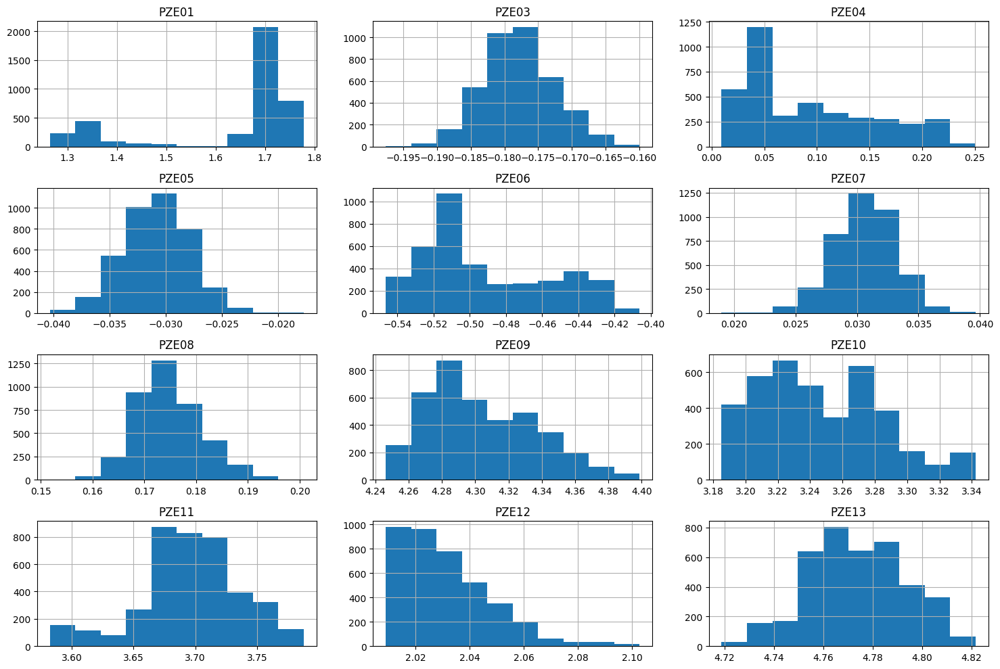

In [13]:
# Supondo que 'df' seja o nome do seu DataFrame
data.hist(figsize=(15, 10))
plt.tight_layout()  # Ajusta o layout para evitar sobreposição de subplots
plt.savefig('/content/drive/MyDrive/Mestrado/imagens/histogramas_dataset01_pzs.png', dpi=300)
plt.show()

In [14]:
data.shape

(3954, 12)

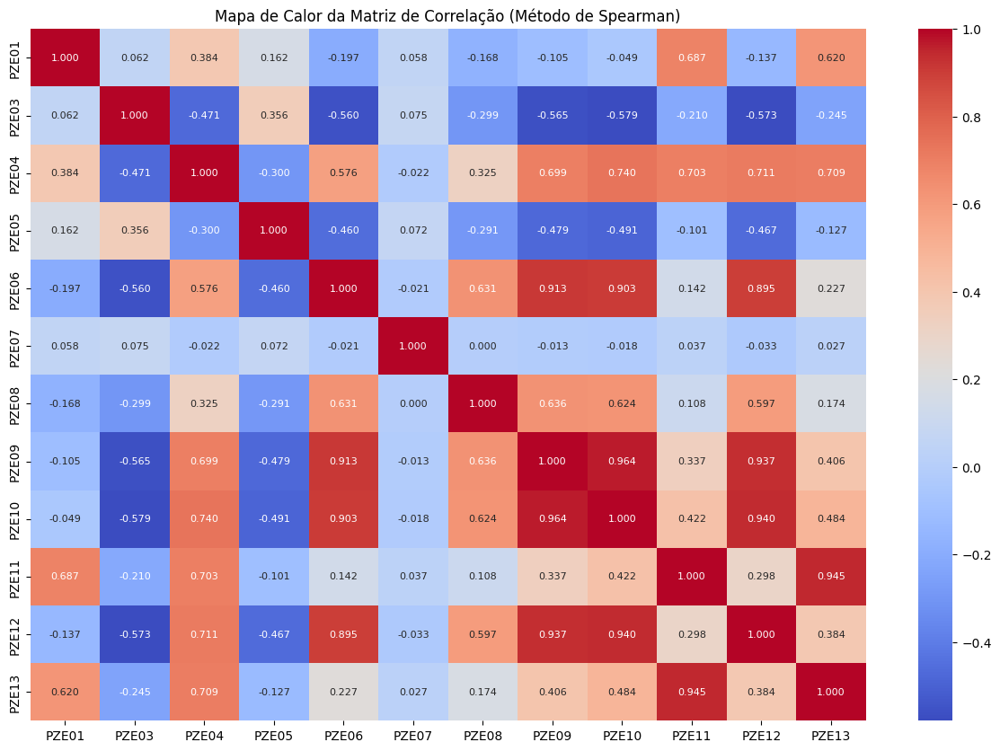

In [15]:
# Calcular a matriz de correlação usando o método de Spearman
correlation_matrix = data.corr(method='spearman')

# Plotar o heatmap da matriz de correlação com tamanho de fonte menor
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".3f", annot_kws={"size": 8})
plt.title('Mapa de Calor da Matriz de Correlação (Método de Spearman)')
plt.savefig('/content/drive/MyDrive/Mestrado/imagens/corr_spearman_dataset01_pzs.png', dpi=300)
plt.show()

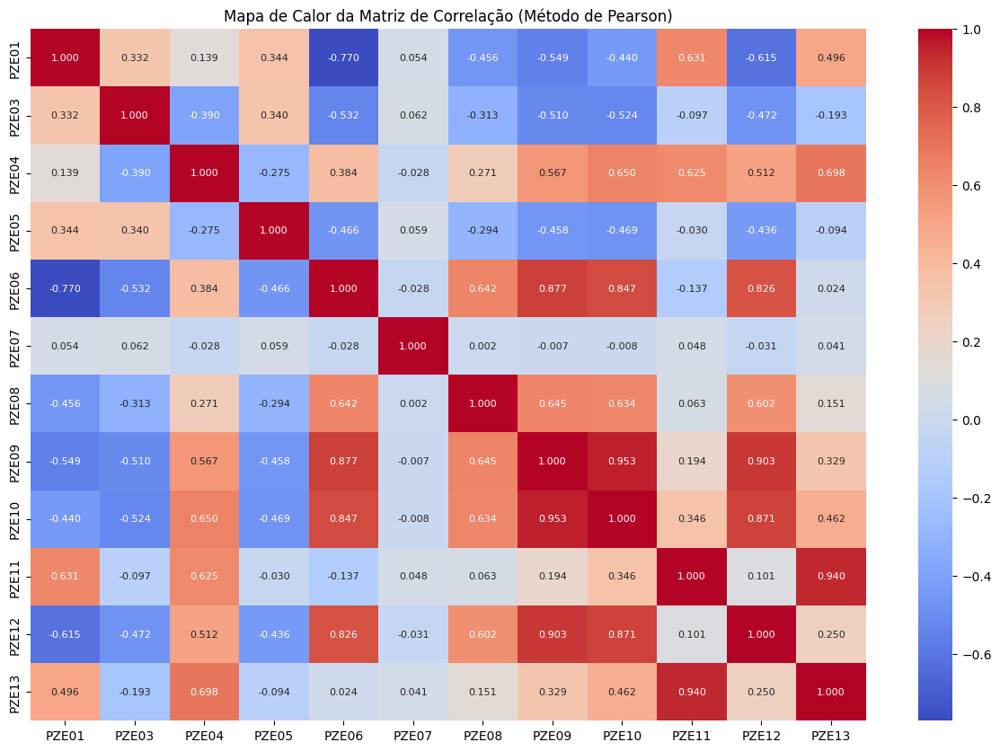

In [16]:
# Calcular a matriz de correlação usando o método de Pearson
correlation_matrix = data.corr(method='pearson')

# Plotar o heatmap da matriz de correlação com tamanho de fonte menor
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".3f", annot_kws={"size": 8})
plt.title('Mapa de Calor da Matriz de Correlação (Método de Pearson)')
plt.savefig('/content/drive/MyDrive/Mestrado/imagens/corr_pearson_dataset01_pzs.png', dpi=300)
plt.show()

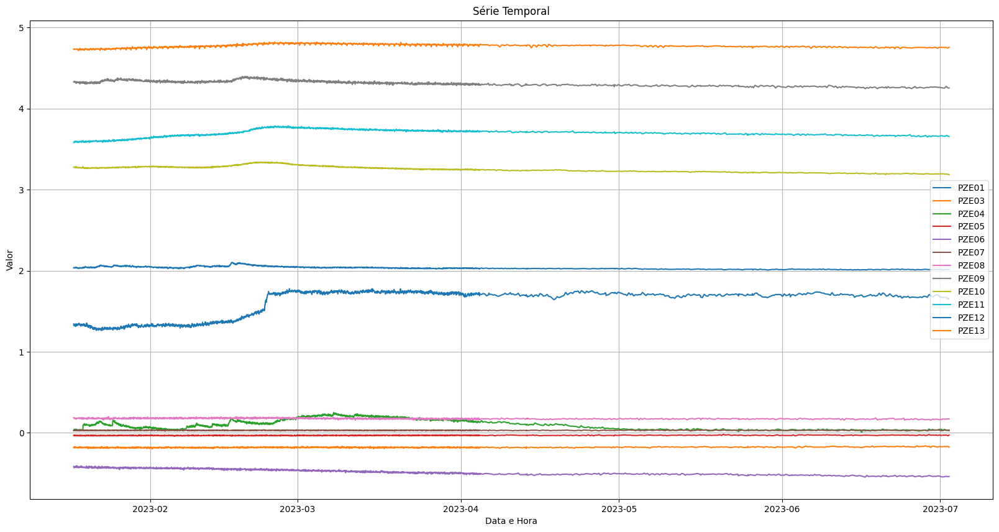

In [17]:
# Plotar a série temporal
plt.figure(figsize=(20, 10))
for column in data.columns:
    plt.plot(data.index, data[column], label=column)
plt.title('Série Temporal')
plt.xlabel('Data e Hora')
plt.ylabel('Valor')
plt.legend()
plt.grid(True)
plt.savefig('/content/drive/MyDrive/Mestrado/imagens/serie_temporal_dataset01_pzs.png', dpi=300)
plt.show()

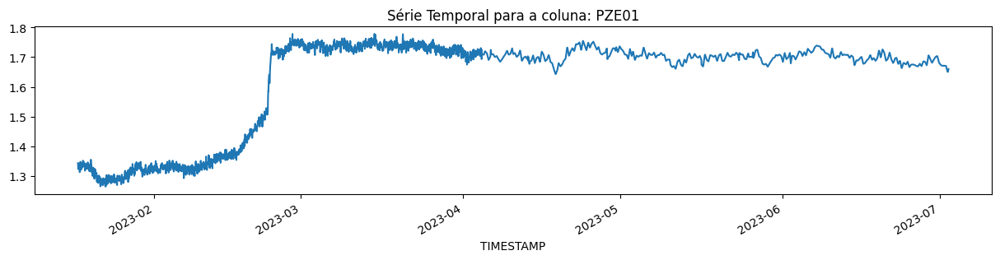

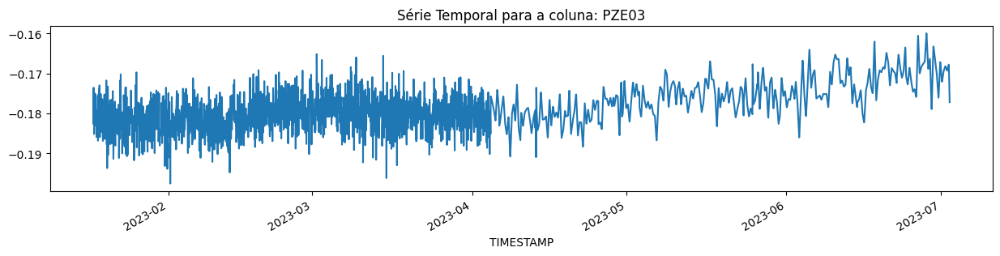

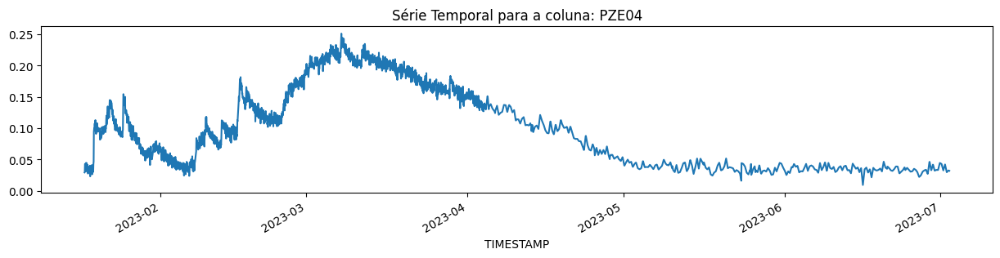

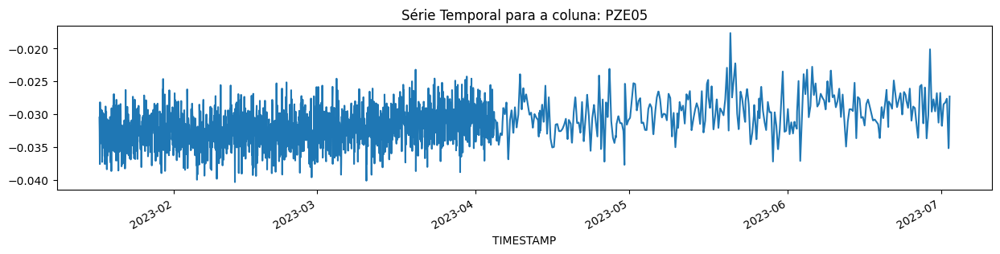

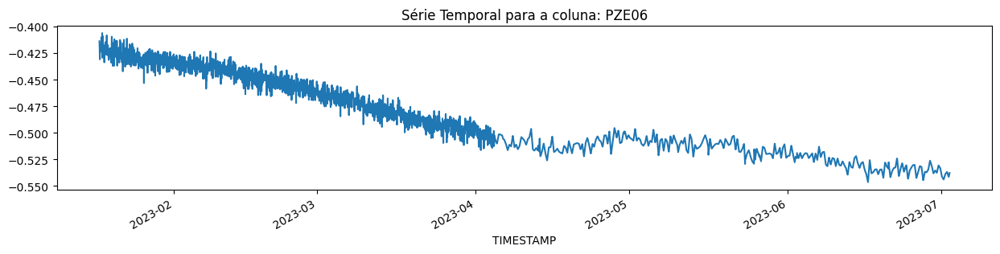

...

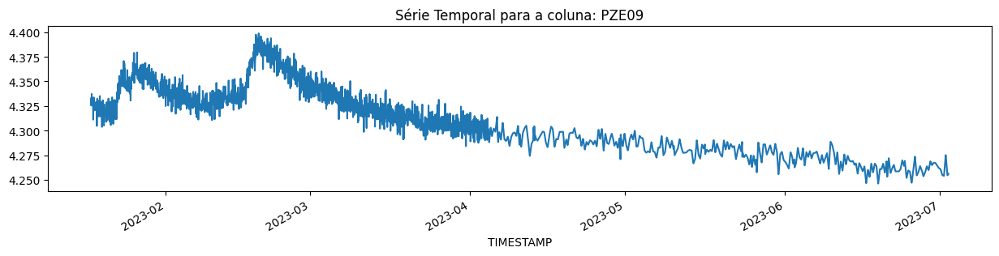

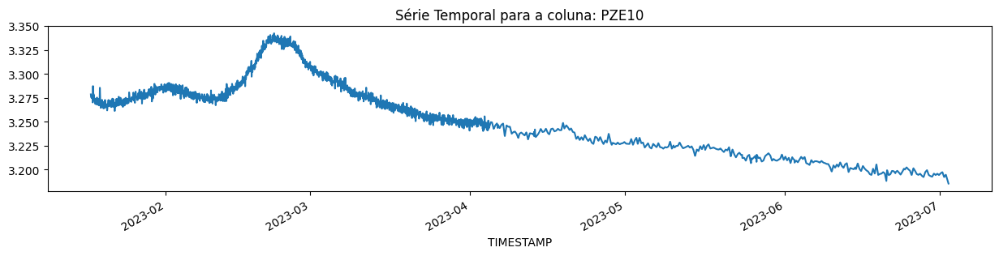

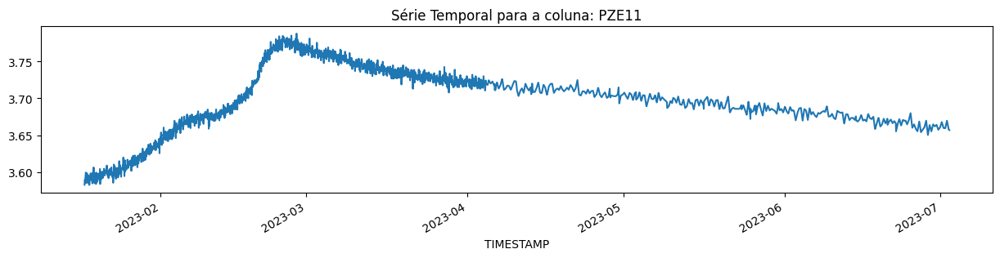

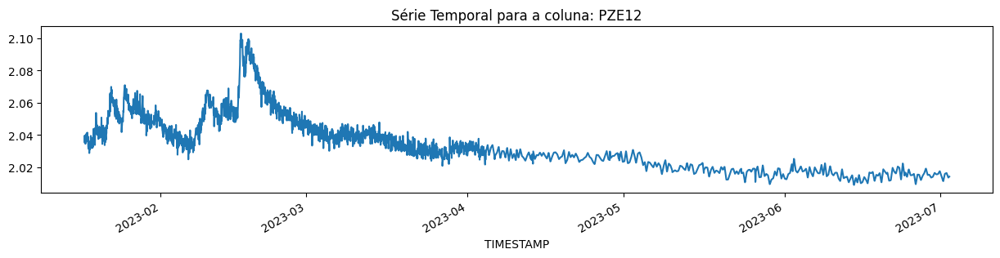

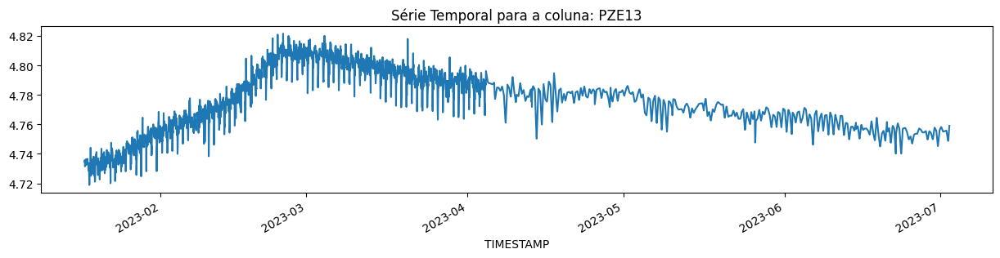

In [18]:
# Iterar sobre as colunas do DataFrame
for column in data.columns:
    # Plotar a série temporal de cada coluna
    plt.figure(figsize=(15, 3))
    data[column].plot()

    # Adicionar título ao gráfico
    plt.title(f'Série Temporal para a coluna: {column}')

    # Salvar a imagem com o nome da coluna
    nome_do_arquivo = f'/content/drive/MyDrive/Mestrado/imagens/{column}_serie_temporal_dataset01.png'
    plt.savefig(nome_do_arquivo, dpi=300)

    # Exibir o gráfico
    plt.show()

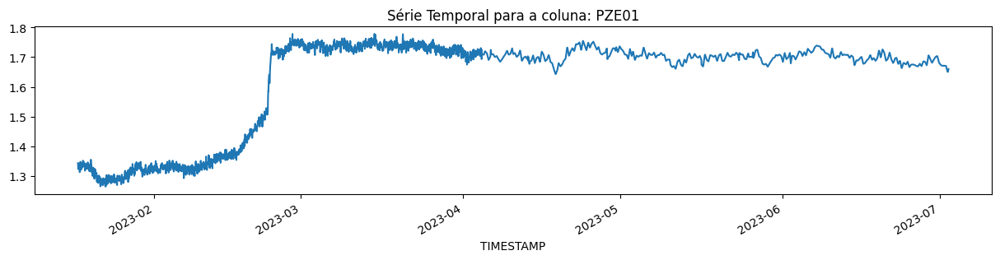

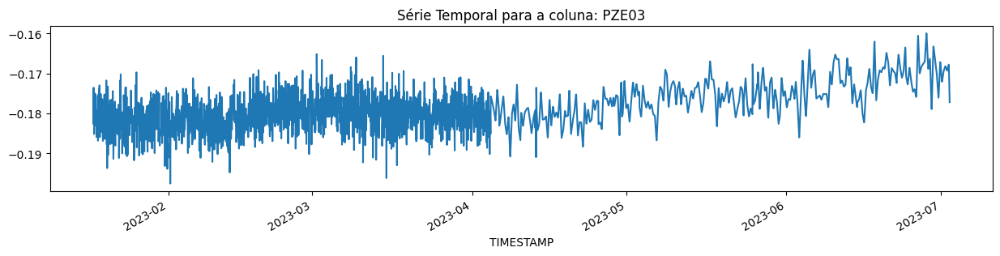

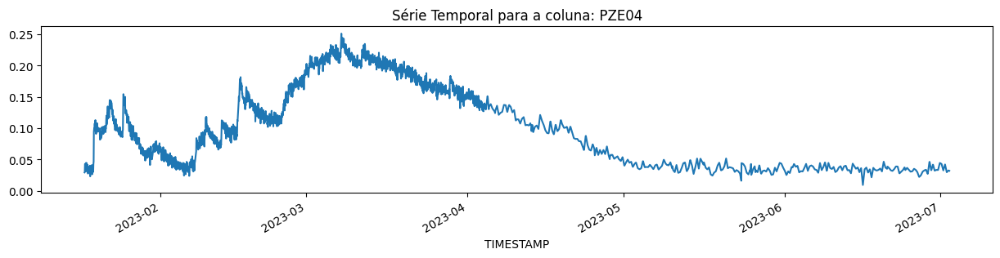

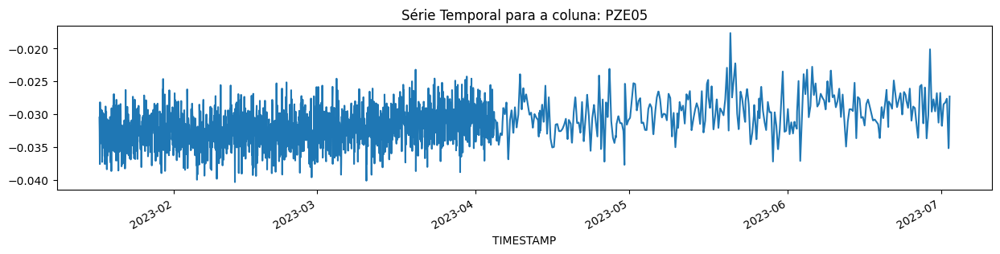

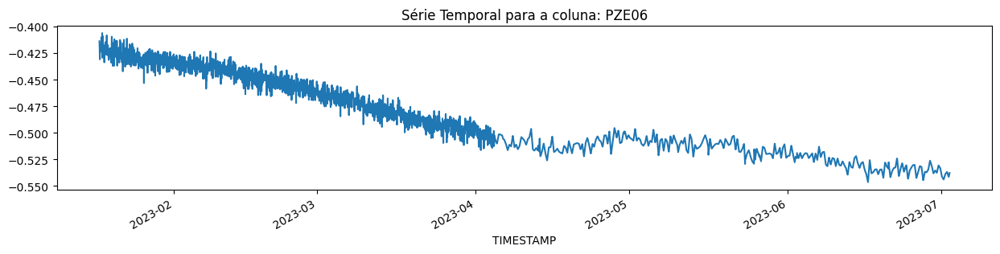

...

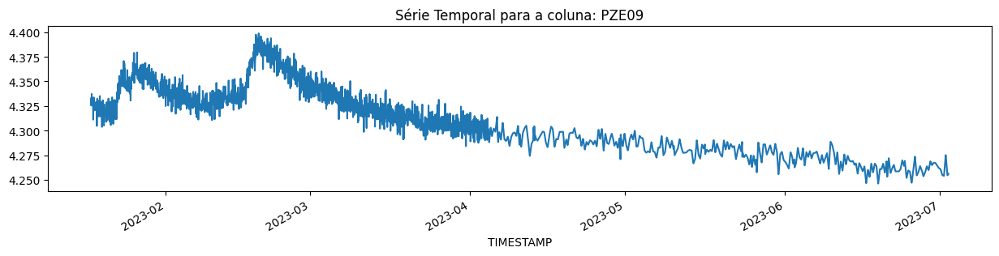

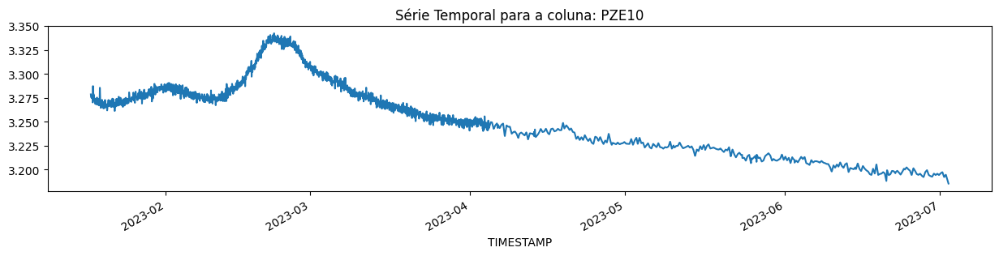

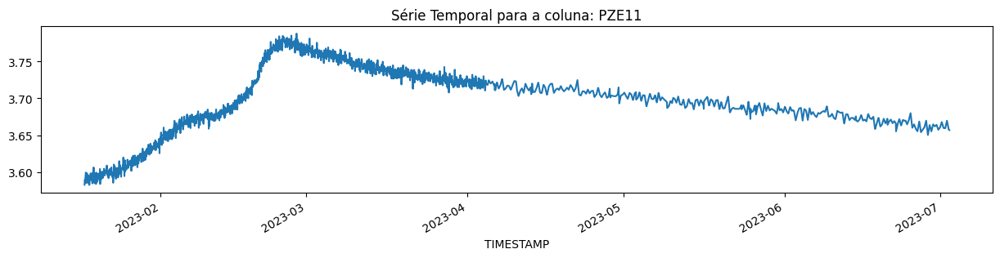

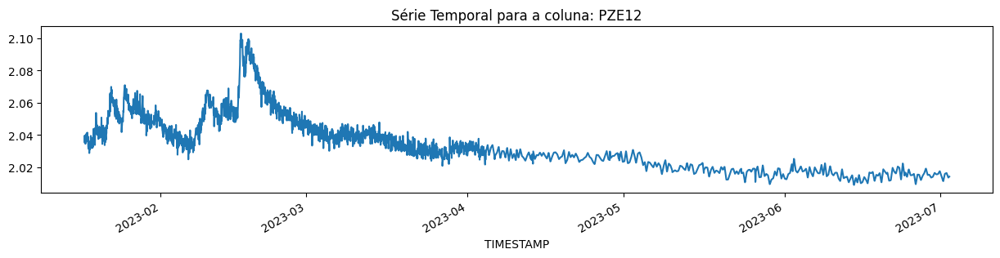

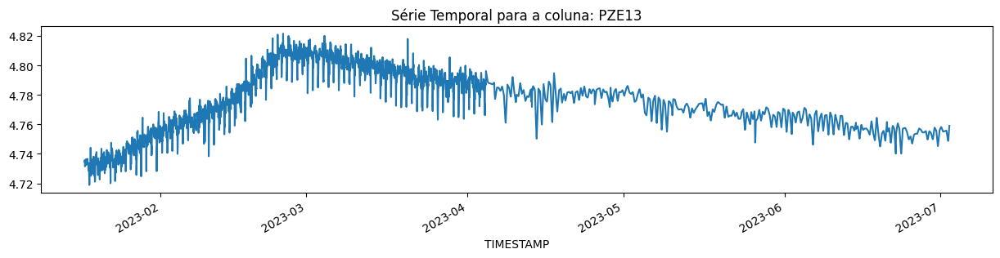

In [19]:
# Iterar sobre as colunas do DataFrame original_df
for column in data.columns:
    # Calcular as diferenças consecutivas e plotar a série temporal de cada coluna
    data[column].plot(figsize=(15, 3))
    plt.title(f'Série Temporal para a coluna: {column}')
    plt.show()

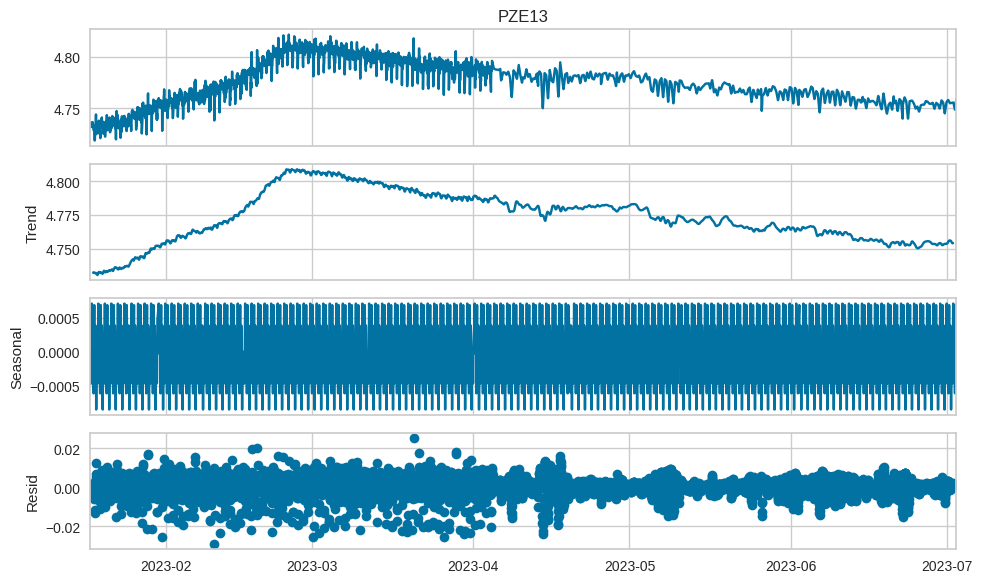

In [ ]:
# Decomposição da série temporal
result = seasonal_decompose(data['PZE13'], model='additive', period=30)

# Plotando os componentes
plt.rcParams['figure.figsize'] = [10, 6]
result.plot()
plt.show()

In [20]:
#teste

# Criar uma instância do MinMaxScaler e ajustar apenas nos dados de treino
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Usar o scaler ajustado para transformar os dados de teste
X_test_scaled = scaler.transform(X_test)

In [21]:
X_test_scaled

array([[ 0.85636577,  0.49932557,  0.0813149 , ...,  0.02444868,
         0.49917082,  0.08748973],
       [ 0.85921053,  0.50873447,  0.08578262, ...,  0.02558698,
         0.50629052,  0.09560338],
       [ 0.86196835,  0.51814337,  0.08983459, ...,  0.02672527,
         0.51341023,  0.10371703],
       ...,
       [ 0.75688708,  0.78138906,  0.06869574, ..., -0.146267  ,
         0.36472851,  0.04724389],
       [ 0.7628323 ,  0.7050804 ,  0.06809056, ..., -0.15160362,
         0.36354363,  0.04883797],
       [ 0.76851324,  0.6287722 ,  0.06755347, ..., -0.15693849,
         0.36235759,  0.05043204]])

In [22]:
# Converter de volta para DataFrames, se necessário
X_train_scaled_df = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

In [23]:
X_train_scaled_df

,PZE01,PZE03,PZE04,PZE05,PZE06,PZE07,PZE08,PZE09,PZE10,PZE11,PZE12
TIMESTAMP,,,,,,,,,,,
2023-01-17 11:00:00,0.152953,0.463627,0.056175,0.433552,0.937421,0.484352,0.716210,0.530250,0.529907,0.001382,0.277824
2023-01-17 12:00:00,0.114198,0.737802,0.059574,0.340332,0.884407,0.655538,0.586486,0.489303,0.508664,0.034329,0.323443
2023-01-17 13:00:00,0.123393,0.573038,0.114599,0.121145,0.799500,0.697472,0.517173,0.479957,0.507165,0.031736,0.278228
2023-01-17 14:00:00,0.140478,0.739001,0.112912,0.535776,0.869055,0.714828,0.622925,0.527391,0.505171,0.033774,0.281910
2023-01-17 15:00:00,0.148889,0.382865,0.100339,0.285633,0.872749,0.485876,0.556472,0.563848,0.500467,0.049521,0.267628
...,...,...,...,...,...,...,...,...,...,...,...
2023-05-30 11:00:00,0.844417,0.475179,0.065946,0.331387,0.118277,0.481590,0.430736,0.144914,0.019045,0.472883,0.061434
2023-05-30 12:00:00,0.844987,0.461690,0.063444,0.353567,0.122959,0.448856,0.400872,0.124213,0.019892,0.470694,0.057847
2023-05-30 13:00:00,0.847832,0.471099,0.067912,0.382498,0.111877,0.445688,0.369412,0.101099,0.021032,0.477813,0.063149


In [24]:
X_test_scaled_df

,PZE01,PZE03,PZE04,PZE05,PZE06,PZE07,PZE08,PZE09,PZE10,PZE11,PZE12
TIMESTAMP,,,,,,,,,,,
2023-05-30 16:00:00,0.856366,0.499326,0.081315,0.469292,0.072383,0.519158,0.275032,0.031760,0.024449,0.499171,0.087490
2023-05-30 17:00:00,0.859211,0.508734,0.085783,0.498224,0.059218,0.543648,0.243572,0.008646,0.025587,0.506291,0.095603
2023-05-30 18:00:00,0.861968,0.518143,0.089835,0.527155,0.046054,0.567730,0.212112,-0.014468,0.026725,0.513410,0.103717
2023-05-30 19:00:00,0.861525,0.546888,0.092753,0.547052,0.051515,0.554986,0.224668,-0.005041,0.027633,0.541105,0.105370
2023-05-30 20:00:00,0.860892,0.585246,0.096922,0.574902,0.061512,0.536781,0.245415,0.013704,0.028603,0.534425,0.104930
...,...,...,...,...,...,...,...,...,...,...,...
2023-07-02 13:00:00,0.750081,0.918900,0.069906,0.247597,-0.097677,0.578281,0.415645,-0.021202,-0.135597,0.372289,0.044056
2023-07-02 14:00:00,0.750942,0.857697,0.069301,0.329634,-0.090452,0.560379,0.409943,-0.018647,-0.140932,0.365913,0.045650
2023-07-02 15:00:00,0.756887,0.781389,0.068696,0.411670,-0.083227,0.538548,0.404241,-0.016093,-0.146267,0.364729,0.047244


In [25]:
# Definir o grau do polinômio para o modelo de regressão polinomial
degree1 = 2  # Ou outro valor que você deseja testar
degree2 = 3  # Ou outro valor que você deseja testar

In [ ]:
# Criando o modelo Random Forest
#model = RandomForestRegressor(n_estimators=50, random_state=42)

#model = RandomForestRegressor(n_jobs=-1)

In [26]:
# Inicializar modelos
lr = LinearRegression()
lr2 = Pipeline([('Poly', PolynomialFeatures(degree=degree1)),('linear', LinearRegression())])
lr3 = Pipeline([('Poly', PolynomialFeatures(degree=degree2)),('linear', LinearRegression())])
rf = RandomForestRegressor(n_estimators=50, random_state=42)
grbt  = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
hist_grbt = HistGradientBoostingRegressor(loss='absolute_error', learning_rate=0.1, max_iter=100, random_state=42)
mlp1 = MLPRegressor(hidden_layer_sizes=(10, 30, 10), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp2 = MLPRegressor(hidden_layer_sizes=(20, 50, 10), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp3 = MLPRegressor(hidden_layer_sizes=(10, 30, 20), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp4 = MLPRegressor(hidden_layer_sizes=(10, 20, 10), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp5 = MLPRegressor(hidden_layer_sizes=(10, 20, 30), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp6 = MLPRegressor(hidden_layer_sizes=(10, 20, 30, 40), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)



In [27]:
# Lista para facilitar o treinamento e avaliação
models = [lr, lr2, lr3, rf, grbt, hist_grbt, mlp1, mlp2, mlp3, mlp4, mlp5, mlp6]
model_names = ['Linear Regression', 'Linear Regression Poly1', 'Linear Regression Poly2', 'Random Forest', 'Gradient Boosting',  'HistGradient Boosting', 'MLP 10-30-10', 'MLP 20-50-10', 'MLP 10-30-20', 'MLP 10-20-10', 'MLP 10-20-30', 'MLP 10-20-30-40']


In [28]:
# Definir o intervalo para a re-treinamento para o # Walk-Forward Validation reduzido
n = 10  # Escolha um valor para 'n' baseado no seu caso de uso

In [29]:
# Lista para armazenar os erros de previsão de cada passo
errors = []

In [30]:
# Walk-Forward Validation reduzido
for i in range(0, len(X_test), n):
    # Atualizar os conjuntos de dados para a iteração atual do walk-forward
    # Certifique-se de não ultrapassar o fim do conjunto de dados
    end_idx = min(i + n, len(X_test))
    X_train_iter = pd.concat([X_train, X_test[:i]])
    y_train_iter = pd.concat([y_train, y_test[:i]])

    # Treinar modelos
    for model in models:
      model.fit(X_train_iter, y_train_iter)

    # Fazer previsões para o próximo bloco
    y_pred = model.predict(X_test.iloc[i:end_idx])

    # Calcular e armazenar os erros de previsão para o bloco atual
    errors.extend(mean_squared_error(y_test.iloc[i:end_idx], y_pred, multioutput='raw_values'))

    # Você pode querer calcular a média dos erros se estiver interessado em uma métrica de erro único
    mean_error = sum(errors) / len(errors)
    print(f"Erro médio: {mean_error}")

Erro médio: 2.5352812962310233e-05
Erro médio: 2.408476422186542e-05
Erro médio: 2.977531860364816e-05
Erro médio: 3.185565971603046e-05
Erro médio: 3.2614043543910715e-05
Erro médio: 3.448721486071159e-05
Erro médio: 3.798083278790848e-05
Erro médio: 3.697827512810096e-05
Erro médio: 3.4343665619572724e-05
Erro médio: 3.09334844270548e-05
Erro médio: 2.841176238140515e-05
Erro médio: 2.7868226475214336e-05
Erro médio: 3.084823663503714e-05
Erro médio: 2.9057969511289135e-05
Erro médio: 2.7489724068714773e-05
Erro médio: 2.8908995193672085e-05
Erro médio: 3.4070763407667076e-05
Erro médio: 3.284675708351674e-05
Erro médio: 3.3457383435793175e-05
Erro médio: 3.216849591060349e-05
Erro médio: 3.146928406763621e-05
Erro médio: 3.0662312169009316e-05
Erro médio: 2.953980919355771e-05
Erro médio: 2.8758995555740116e-05
Erro médio: 2.872639396615046e-05
Erro médio: 2.9140468055975036e-05
Erro médio: 2.961946054781401e-05
Erro médio: 2.8764367013588816e-05
Erro médio: 2.8523469808116195e-05
E

In [31]:
# Avaliar modelos e comparar resultados
results = {}
for (name, model) in zip(model_names, models):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse) # RMSE é simplesmente a raiz quadrada do MSE
    r2 = model.score(X_test, y_test)

    results[name] = {
        'MSE': mse,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2
    }

    print(f'{name} - MSE: {mse}, MAE: {mae}, RMSE: {rmse}, R2: {r2}')


Linear Regression - MSE: 2.008364908898908e-05, MAE: 0.003386422483541293, RMSE: 0.004481478449015356, R2: 0.44133282358763337
Linear Regression Poly1 - MSE: 1.4049920557719698e-05, MAE: 0.002927809949386273, RMSE: 0.003748322365768411, R2: 0.6091731431862804
Linear Regression Poly2 - MSE: 1.017940805984634e-05, MAE: 0.0024342395682874904, RMSE: 0.0031905184625459137, R2: 0.7168392490256414
Random Forest - MSE: 3.7276985281904673e-07, MAE: 0.00042157212943402794, RMSE: 0.0006105488128061889, R2: 0.98963065525576
Gradient Boosting - MSE: 8.403657663055509e-06, MAE: 0.0022321497917015746, RMSE: 0.002898906287387626, R2: 0.7662353251964887
HistoGradient Boostin - MSE: 2.3389275148756684e-06, MAE: 0.0007988464035675574, RMSE: 0.0015293552611723897, R2: 0.9349380172508005
MLP 10-30-10 - MSE: 2.0579244880235922e-05, MAE: 0.0035561884706805766, RMSE: 0.0045364352613297505, R2: 0.42754682782008535
MLP 20-50-10 - MSE: 7.990171655344946e-05, MAE: 0.007213429309416425, RMSE: 0.008938776009804108,

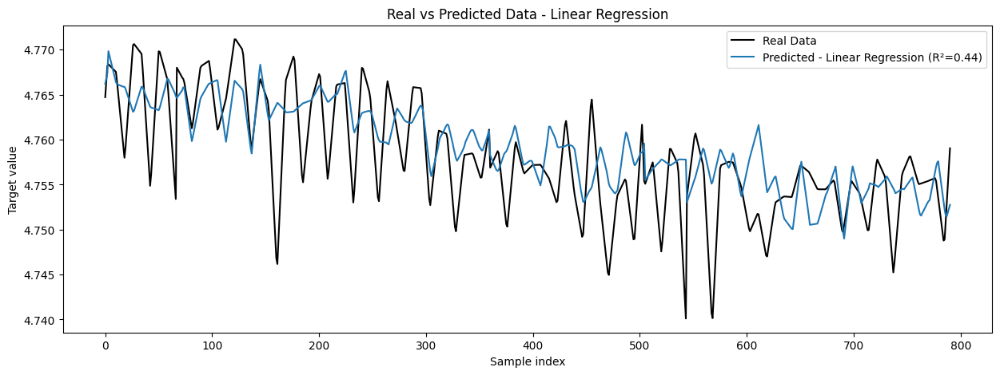

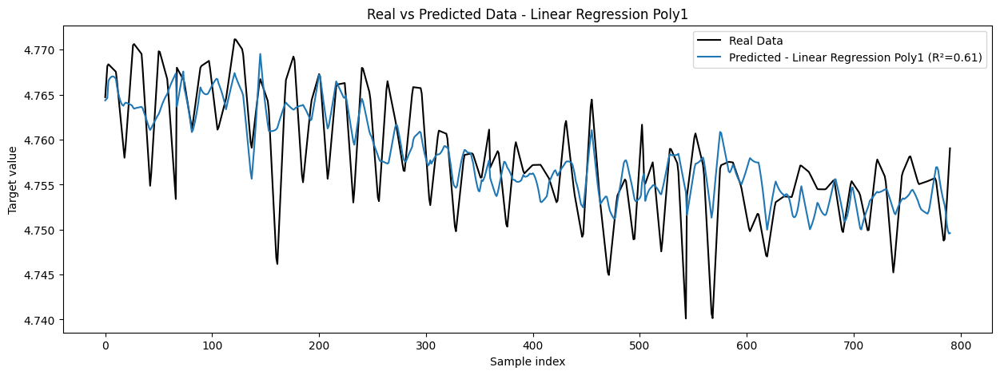

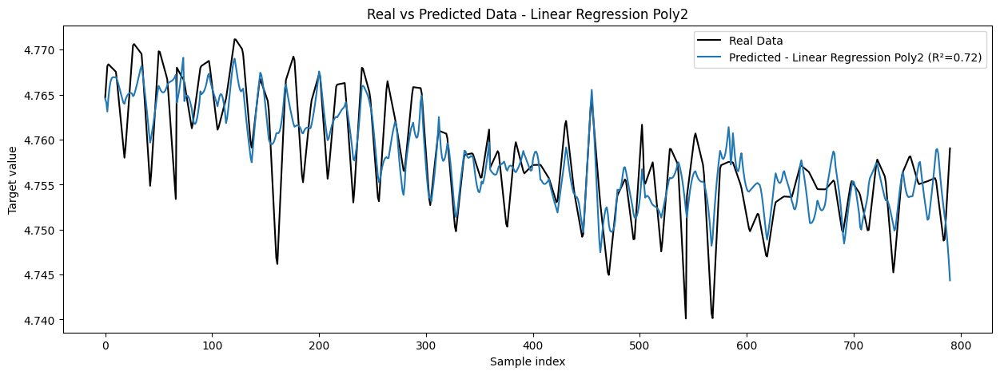

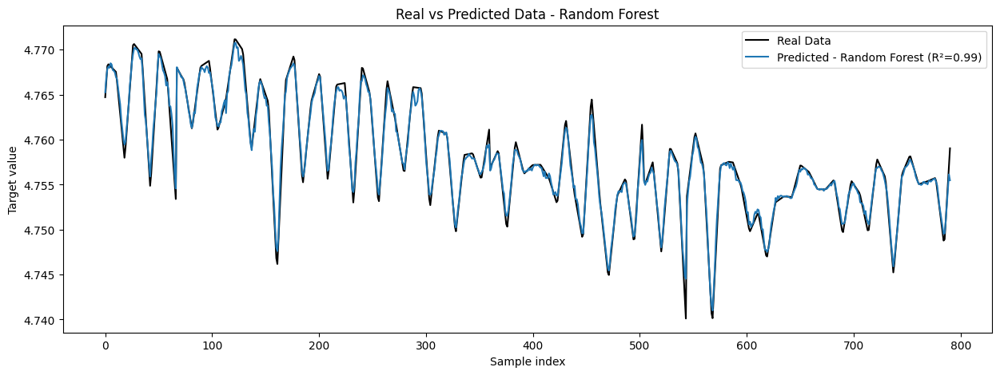

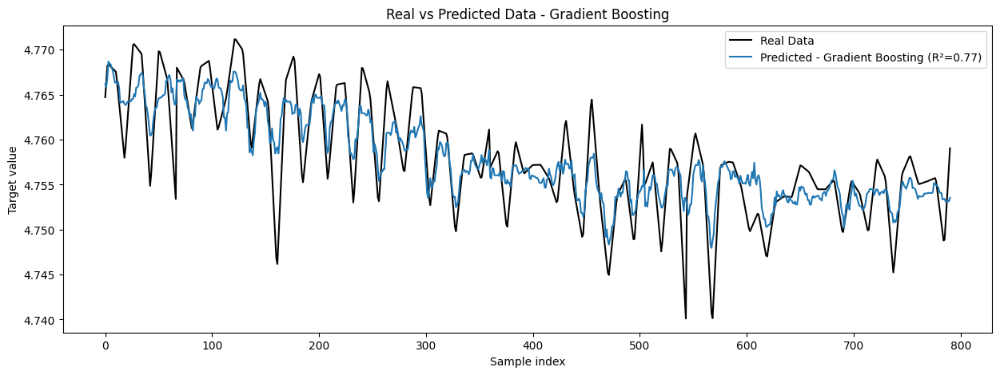

...

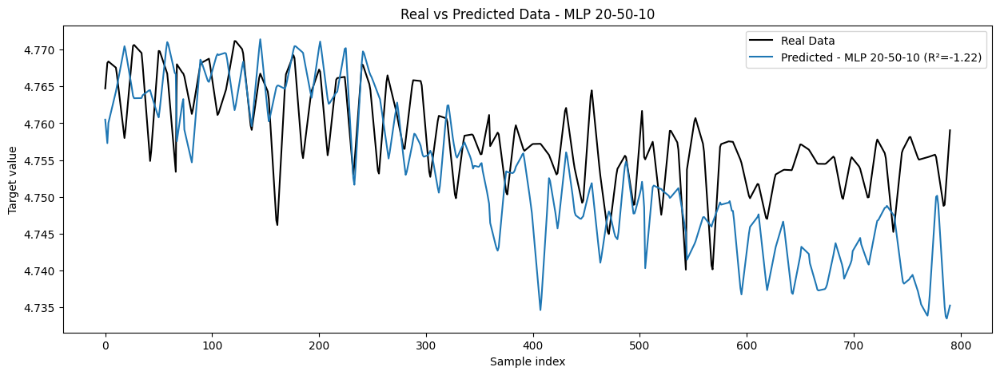

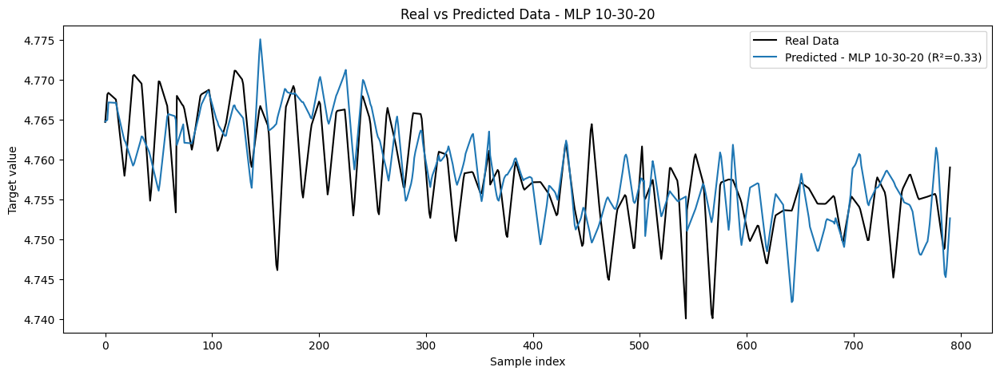

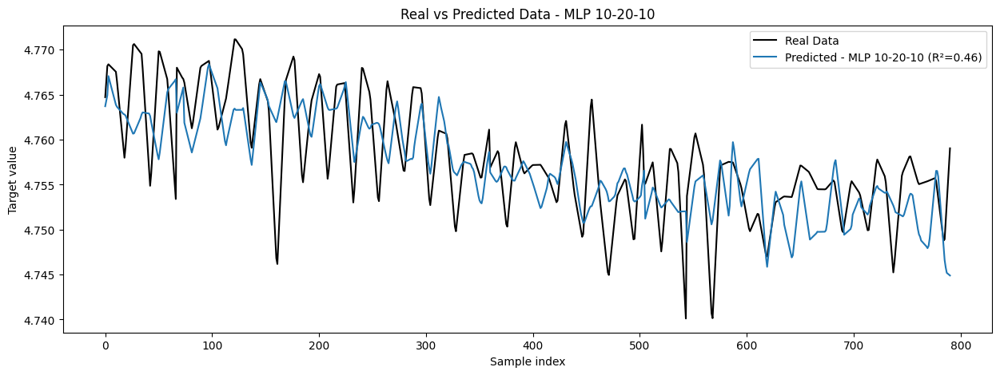

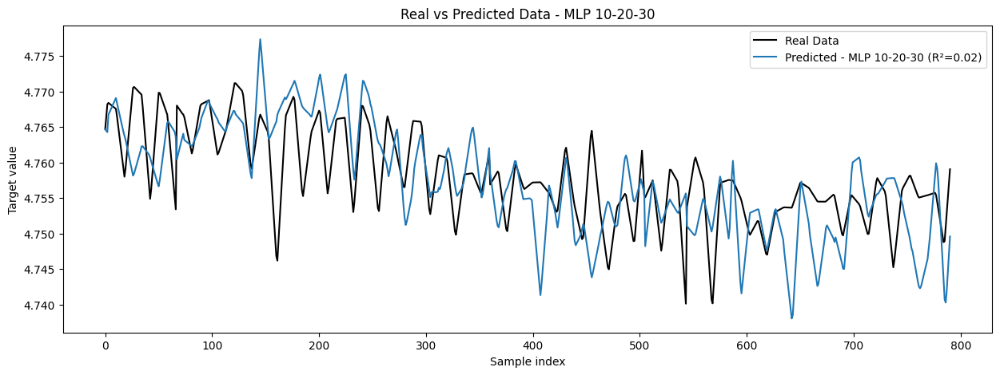

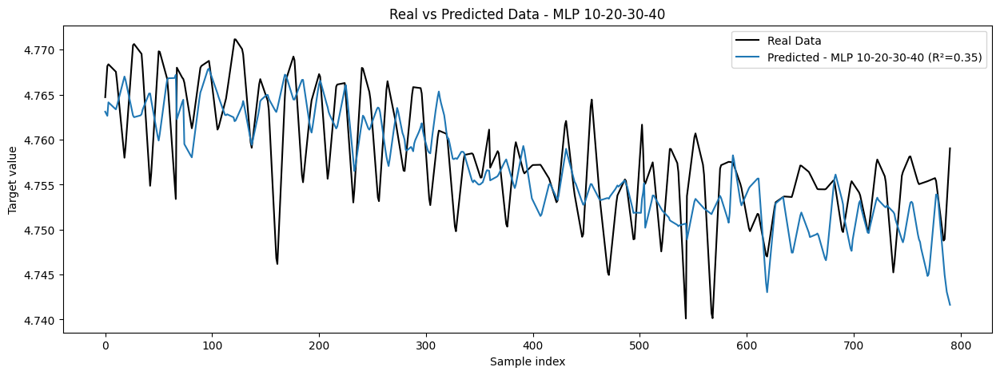

In [34]:
# Supondo que você tenha as variáveis y_test, model_names, models e X_test definidas anteriormente

# Plotar resultados reais vs. previsões para cada modelo em figuras separadas
for (name, model) in zip(model_names, models):
    plt.figure(figsize=(15, 5))  # Cria uma nova figura para cada modelo
    plt.plot(y_test.values, label='Real Data', color='black')

    # Obter previsões do modelo
    predictions = model.predict(X_test)

    # Calcular R²
    r2 = model.score(X_test, y_test)

    # Plotar previsões do modelo na figura atual
    plt.plot(predictions, label=f'Predicted - {name} (R²={r2:.2f})')

    # Adicionando título e legenda
    plt.title(f'Real vs Predicted Data - {name}')
    plt.xlabel('Sample index')
    plt.ylabel('Target value')
    plt.legend()

    # Salvar o gráfico no Google Drive
    plt.savefig(f'/content/drive/MyDrive/Mestrado/imagens/{name}_prediction_plot.png', dpi=300)  # Salvar o gráfico como uma imagem PNG
    plt.show()

In [ ]:
'''

# Supondo que você tenha as variáveis y_test, model_names, models e X_test definidas anteriormente

# Plotar resultados reais vs. previsões para cada modelo em figuras separadas
for (name, model) in zip(model_names, models):
    plt.figure(figsize=(15, 5))  # Cria uma nova figura para cada modelo
    plt.plot(y_test.values, label='Real Data', color='black')

    # Obter previsões do modelo
    predictions = model.predict(X_test)

    # Plotar previsões do modelo na figura atual
    plt.plot(predictions, label=f'Predicted - {name}')

    # Adicionando título e legenda
    plt.title(f'Real vs Predicted Data - {name}')
    plt.xlabel('Sample index')
    plt.ylabel('Target value')
    plt.legend()

    # Mostrar o gráfico
    plt.show()
'''

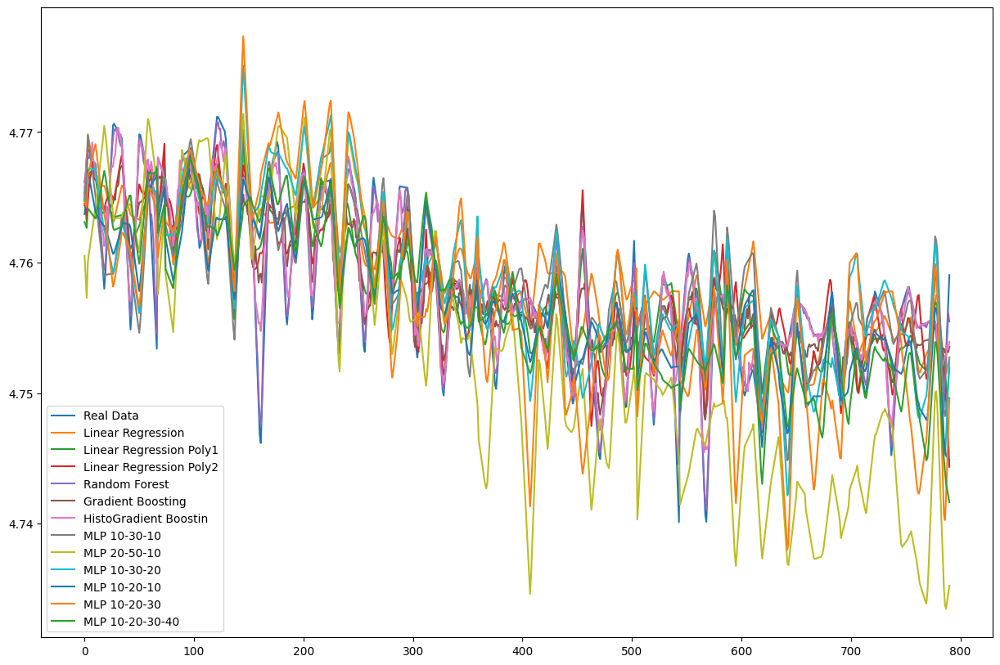

In [36]:

# Plotar resultados reais vs. previsões para comparar visualmente
plt.figure(figsize=(15, 10))
plt.plot(y_test.values, label='Real Data')
for (name, model) in zip(model_names, models):
    predictions = model.predict(X_test)
    plt.plot(predictions, label=name)
plt.legend()
plt.show()

Conformal Prediction for Regression

https://github.com/PacktPublishing/Practical-Guide-to-Applied-Conformal-Prediction/blob/main/Chapter_07.ipynb


In [37]:
!pip install dtype_diet
!pip install openml
!pip install mapie
!pip install crepes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 3.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 26.1 MB/s eta 0:00:00
  Created wheel for openml: filename=openml-0.14.2-py3-none-any.whl size=158699 sha256=3bee059fe67b5b428d0fbfd148e5a2e3603ee37466c86e57b3c0309dea2ee289
  Stored in directory: /root/.cache/pip/wheels/2e/4e/af/5e721761d86375dbca82e63cc2470019e97815bc39f11451ea
  Created wheel for liac-arff: filename=liac_arff-2.5.0-py3-none-any.whl size=11716 sha256=01eeb04c7c77f25a6a49262bafa4f6027be0d147d82b3015eebbc0b9d050cd36
  Stored in directory: /root/.cache/pip/wheels/5d/2a/9c/3895d9617f8f49a0883ba686326d598e78a1c2f54fe3cae86d
Successfully built

In [38]:
!pip install aws-fortuna==0.1.36

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 321.0/321.0 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.2/227.2 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.2/197.2 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.0/214.0 MB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 40.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 29.7 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      S

In [39]:
!pip install jax==0.4.14
!pip install jaxlib==0.4.14

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 4.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for jax: filename=jax-0.4.14-py3-none-any.whl size=1535361 sha256=29fffe9a2660d8d447abb710b3098909adcd95a412b8b2d528a412c996af92bb
  Stored in directory: /root/.cache/pip/wheels/85/52/e7/dfa571c9f9b879e3facaa1584f52be04c4c3d1e14054ef40ab
Successfully built jax
  Attempting uninstall: jax
    Found existing installation: jax 0.4.26
    Uninstalling jax-0.4.26:
      Successfully uninstalled jax-0.4.26
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires jax>=0.4.16, but you have jax 0.4.14 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 MB 7.9 MB/s eta 0:00:00
  Attempting uninstall: jaxlib


In [40]:
import ml_dtypes
import numpy as np
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import HistGradientBoostingRegressor

from fortuna.conformal import EnbPI
from fortuna.conformal import QuantileConformalRegressor
from fortuna.metric.regression import prediction_interval_coverage_probability

In [41]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnnotationBbox, TextArea
from matplotlib.ticker import FormatStrFormatter

import plotly.graph_objects as go

import openml
from sklearn.datasets import fetch_openml

%matplotlib inline

from sklearn.ensemble import RandomForestRegressor

import plotly.express as px

from yellowbrick.regressor import PredictionError

from tqdm import tqdm

from crepes.extras import binning

from lightgbm import LGBMRegressor
from scipy.stats import randint, uniform
from sklearn.model_selection import KFold, RandomizedSearchCV, train_test_split

from mapie.metrics import regression_coverage_score, regression_mean_width_score
from mapie.regression import MapieQuantileRegressor, MapieRegressor
from mapie.subsample import Subsample

from crepes import WrapRegressor
from crepes.extras import DifficultyEstimator

random_state = 23
rng = np.random.default_rng(random_state)
round_to = 3

import warnings
warnings.filterwarnings('ignore')

In [42]:
# Supondo que 'data' é um DataFrame Pandas e 'target' é a coluna que você deseja prever
X = data.drop('PZE13', axis=1)  # Substitua 'target' pelo nome real da sua variável dependente
y = data['PZE13']  # Variável dependente

In [43]:
# Determinar os tamanhos dos conjuntos de treino, teste e calibração
n_train = int(len(X) * 0.6)
n_test = int(len(X) * 0.2)  # 20% para teste

# A última parte dos dados será usada para calibração
# A divisão de calibração começa onde a divisão de teste termina
n_cal = len(X) - n_train - n_test

# Dividir os dados em conjuntos de treino, teste e calibração
X_train, X_test, X_cal = X[:n_train], X[n_train:n_train+n_test], X[n_train+n_test:]
y_train, y_test, y_cal = y[:n_train], y[n_train:n_train+n_test], y[n_train+n_test:]

In [44]:
# split the datasets into 3 datasets: proper traininig set, calibration and test
# proper training set is used to train the underlying model, calibration set is used by Conformal Prediction
# test set is used to test models

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=100, shuffle = True, random_state=42)

# we will use 1000 objects for calibration
X_proper_train, X_cal, y_proper_train, y_cal = train_test_split(X_train, y_train, test_size=791)

In [45]:
print('Data split. Parts sizes: train = {}, calib = {}, test = {}'.format(X_proper_train.shape, X_cal.shape, X_test.shape))

Data split. Parts sizes: train = (1581, 11), calib = (791, 11), test = (790, 11)


In [46]:
# Definir o grau do polinômio para o modelo de regressão polinomial
degree1 = 2  # Ou outro valor que você deseja testar
degree2 = 3  # Ou outro valor que você deseja testar

In [48]:
# Inicializar modelos
lr = LinearRegression()
lr2 = Pipeline([('Poly', PolynomialFeatures(degree=degree1)),('linear', LinearRegression())])
lr3 = Pipeline([('Poly', PolynomialFeatures(degree=degree2)),('linear', LinearRegression())])
rf = RandomForestRegressor(n_estimators=50, random_state=42)
grbt  = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
hist_grbt = HistGradientBoostingRegressor(loss='absolute_error', learning_rate=0.1, max_iter=100, random_state=42)
mlp1 = MLPRegressor(hidden_layer_sizes=(10, 30, 10), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp2 = MLPRegressor(hidden_layer_sizes=(20, 50, 10), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp3 = MLPRegressor(hidden_layer_sizes=(10, 30, 20), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp4 = MLPRegressor(hidden_layer_sizes=(10, 20, 10), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp5 = MLPRegressor(hidden_layer_sizes=(10, 20, 30), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)
mlp6 = MLPRegressor(hidden_layer_sizes=(10, 20, 30, 40), activation='relu', solver='lbfgs', max_iter=1000, random_state=42)

In [49]:
# Lista para facilitar o treinamento e avaliação
models = [lr, lr2, lr3, rf, grbt, hist_grbt, mlp1, mlp2, mlp3, mlp4, mlp5, mlp6]
model_names = ['Linear Regression', 'Linear Regression Poly1', 'Linear Regression Poly2', 'Random Forest', 'Gradient Boosting',  'HistGradient Boosting', 'MLP 10-30-10', 'MLP 20-50-10', 'MLP 10-30-20', 'MLP 10-20-10', 'MLP 10-20-30', 'MLP 10-20-30-40']

In [50]:
# Definir o intervalo para a re-treinamento para o # Walk-Forward Validation reduzido
n = 10  # Escolha um valor para 'n' baseado no seu caso de uso

In [51]:
# Lista para armazenar os erros de previsão de cada passo
errors = []

In [52]:
# Walk-Forward Validation reduzido
for i in range(0, len(X_test), n):
    # Atualizar os conjuntos de dados para a iteração atual do walk-forward
    # Certifique-se de não ultrapassar o fim do conjunto de dados
    end_idx = min(i + n, len(X_test))
    X_train_iter = pd.concat([X_train, X_test[:i]])
    y_train_iter = pd.concat([y_train, y_test[:i]])

    # Treinar modelos
    for model in models:
      model.fit(X_train_iter, y_train_iter)

    # Fazer previsões para o próximo bloco
    y_pred = model.predict(X_test.iloc[i:end_idx])

    # Calcular e armazenar os erros de previsão para o bloco atual
    errors.extend(mean_squared_error(y_test.iloc[i:end_idx], y_pred, multioutput='raw_values'))

    # Você pode querer calcular a média dos erros se estiver interessado em uma métrica de erro único
    mean_error = sum(errors) / len(errors)
    print(f"Erro médio: {mean_error}")

Erro médio: 5.031416244629529e-05
Erro médio: 3.242731511111993e-05
Erro médio: 3.401427340667222e-05
Erro médio: 3.058787574503511e-05
Erro médio: 3.9257751783704835e-05
Erro médio: 3.579213788990724e-05
Erro médio: 3.749193167812436e-05
Erro médio: 3.315947931702137e-05
Erro médio: 3.353483609379243e-05
Erro médio: 3.071626602375234e-05
Erro médio: 3.862958043957438e-05
Erro médio: 3.661855758231787e-05
Erro médio: 3.489485339306775e-05
Erro médio: 3.245264412263806e-05
Erro médio: 3.25716013620155e-05
Erro médio: 3.055624340228812e-05
Erro médio: 2.96677809484188e-05
Erro médio: 2.8996037523075296e-05
Erro médio: 3.4508847005093994e-05
Erro médio: 3.418948596476688e-05
Erro médio: 3.320420006804773e-05
Erro médio: 3.349323636019579e-05
Erro médio: 3.4084817741707025e-05
Erro médio: 3.581934820515422e-05
Erro médio: 3.483528836959778e-05
Erro médio: 3.4893934799430205e-05
Erro médio: 3.56445878453825e-05
Erro médio: 3.484323996578488e-05
Erro médio: 4.0308663254541276e-05
Erro médio:

In [53]:
alpha = 0.05
n_cal = len(y_cal)
n_cal

791

In [ ]:
'''

import os

# Caminho para a pasta onde as imagens serão salvas
save_path = '/content/drive/MyDrive/Mestrado/imagens/Dataset01'

# Verificar se o diretório existe, caso contrário, criar
if not os.path.exists(save_path):
    os.makedirs(save_path)

# make point predictions on the calibration and test sets
for (name, model) in zip(model_names, models):
    y_pred_cal = model.predict(X_cal)
    y_pred_test = model.predict(X_test)

    visualizer = PredictionError(model)
    visualizer.score(X_cal, y_cal)  # Evaluate the model on the test data

    # Plotar e salvar a figura
    save_file = os.path.join(save_path, f'{name}_prediction_error_plot.png')
    visualizer.show(outpath=save_file, dpi=300)

    # Adicionar título ao arquivo salvo
    plt.title(f'Prediction Error Plot - {name}')
    plt.savefig(save_file, dpi=300)
    visualizer.show()
    #plt.close()
'''

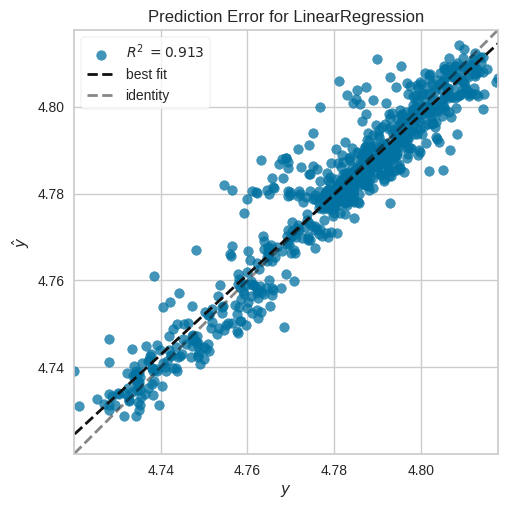

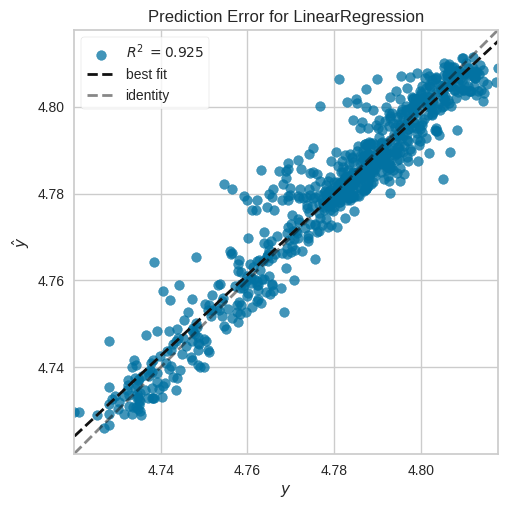

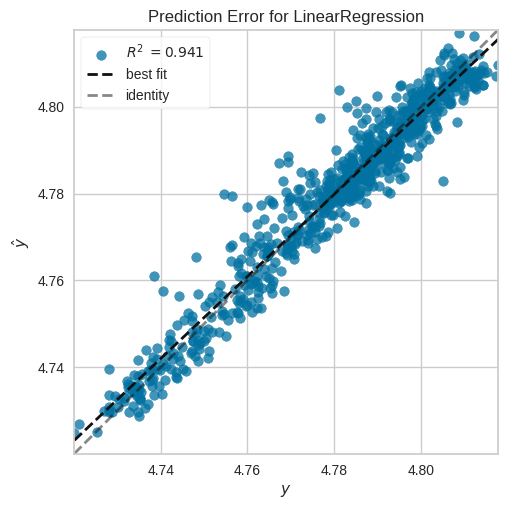

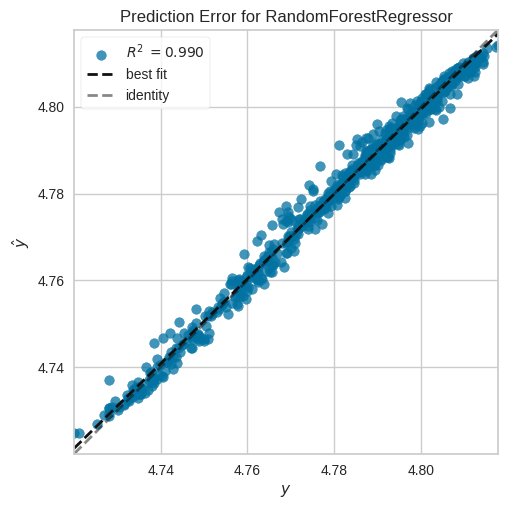

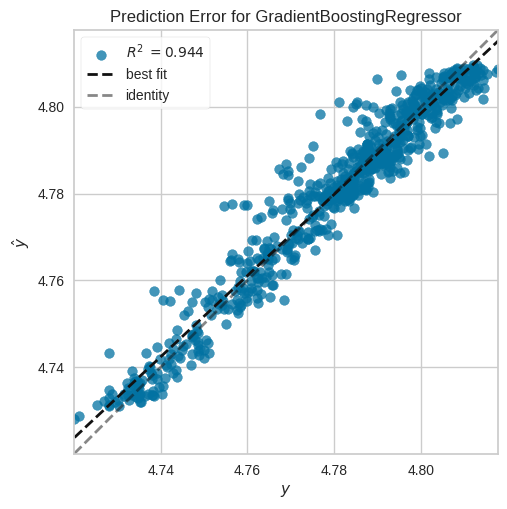

...

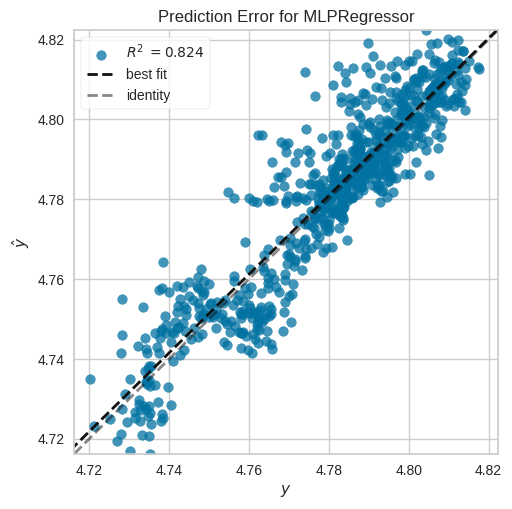

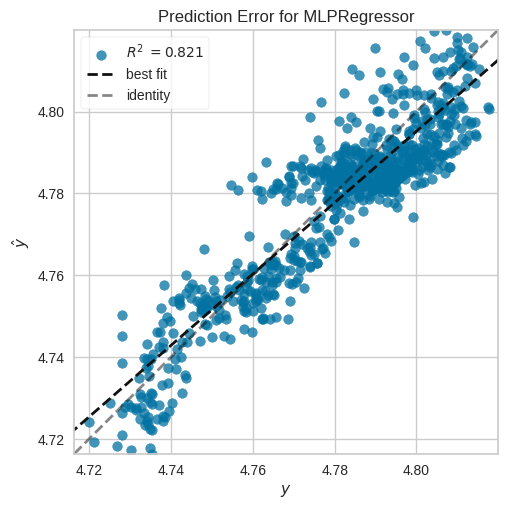

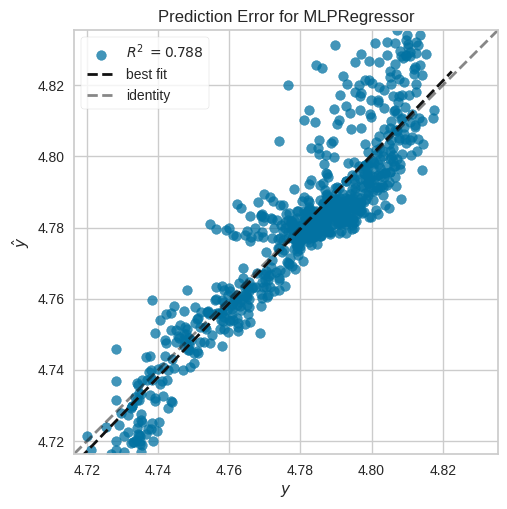

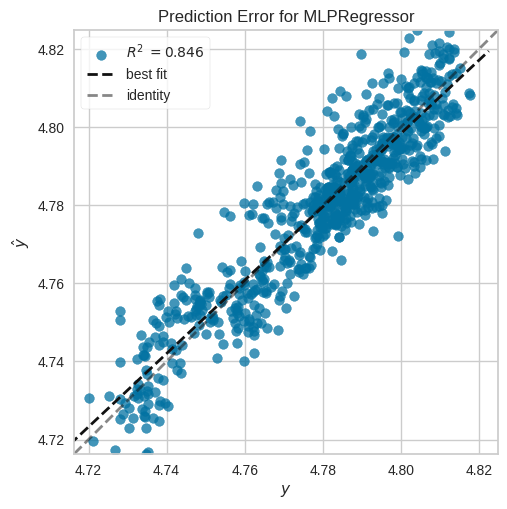

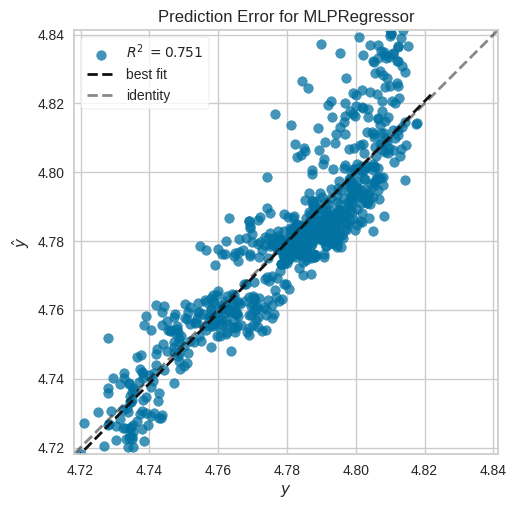

In [59]:
# make point predictions on the calibration and test sets

for (name, model) in zip(model_names, models):
  y_pred_cal = model.predict(X_cal)
  y_pred_test = model.predict(X_test)

  visualizer = PredictionError(model)
  visualizer.score(X_cal, y_cal)  # Evaluate the model on the test data
  visualizer.show()               # Finalize and render the figure

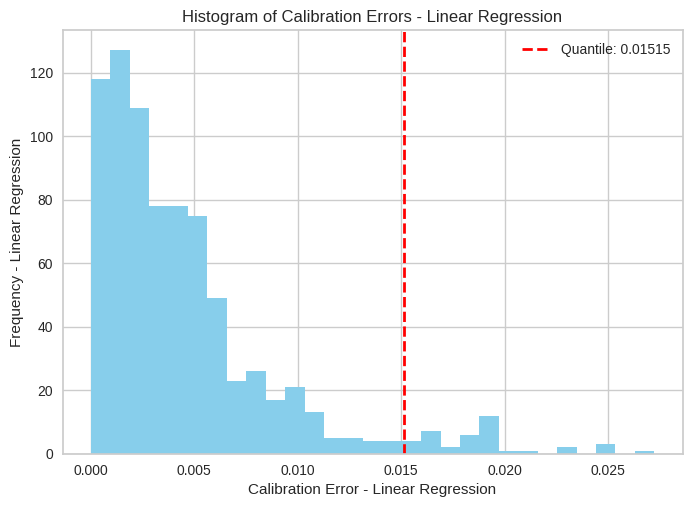

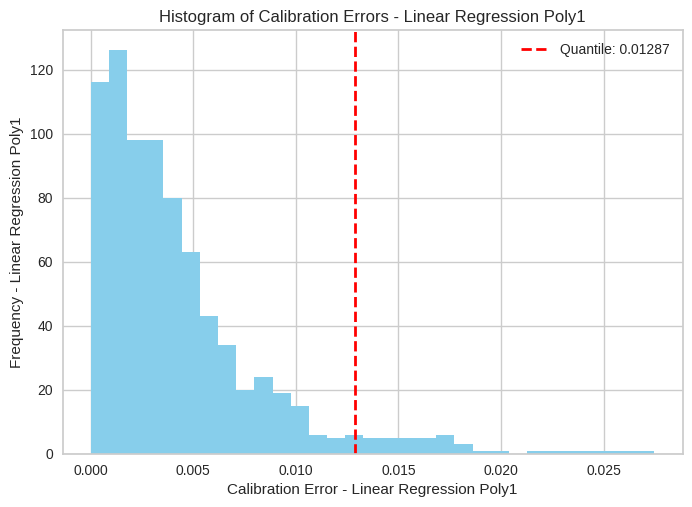

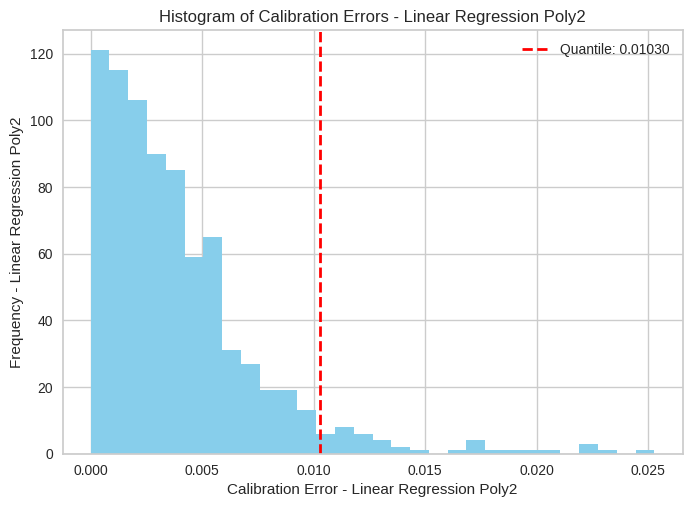

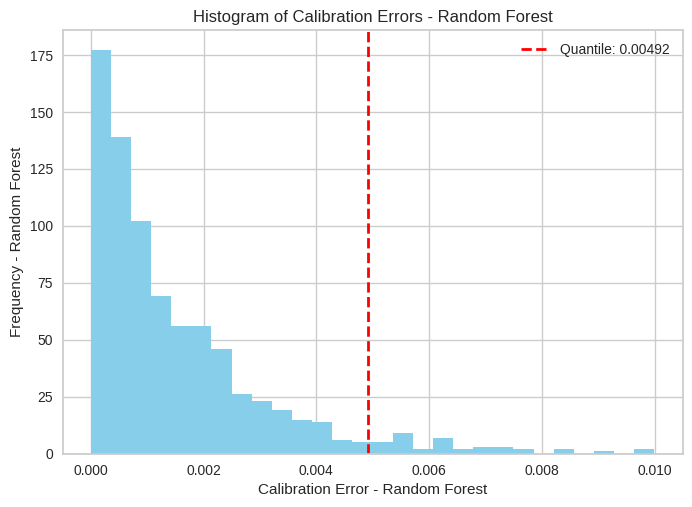

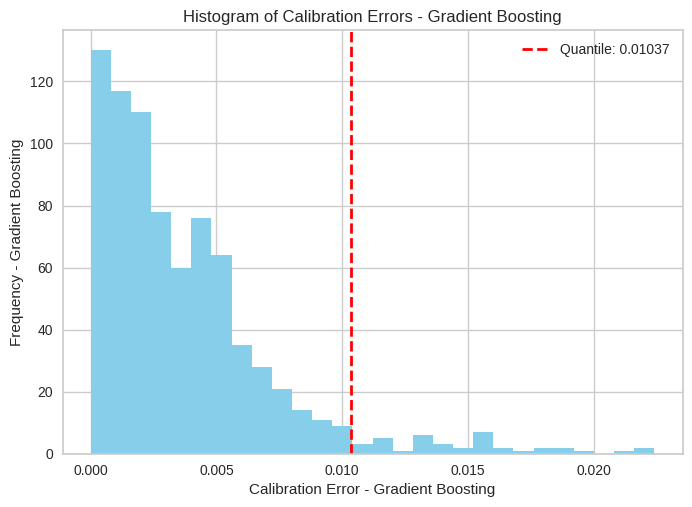

...

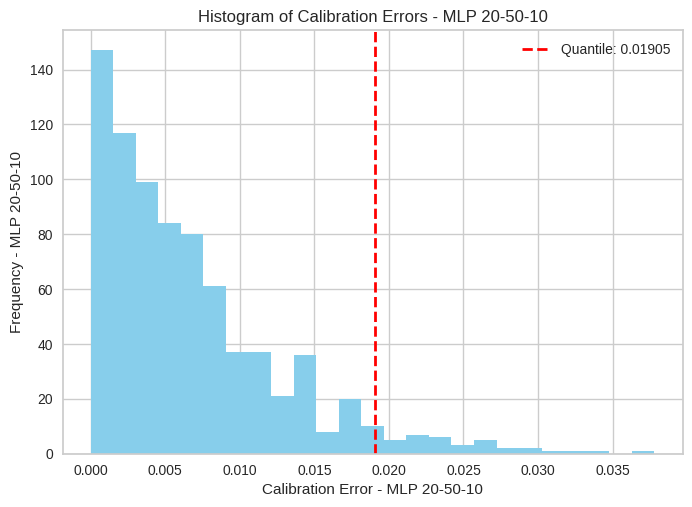

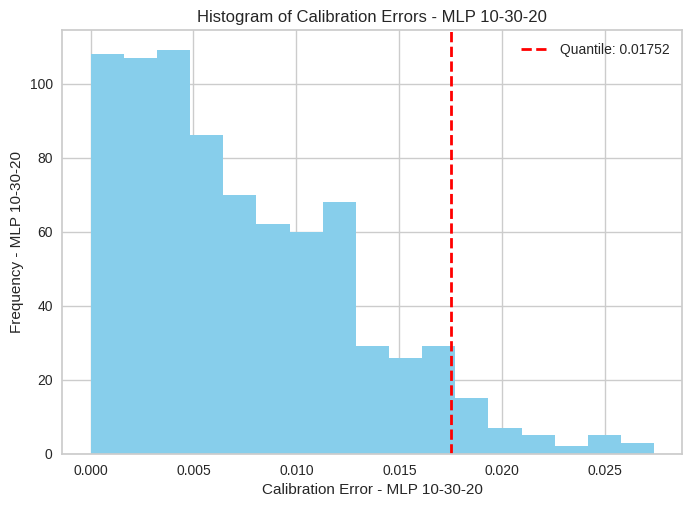

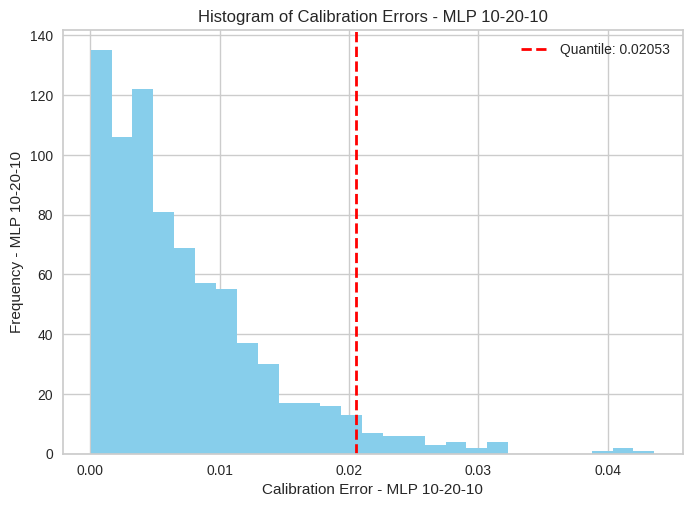

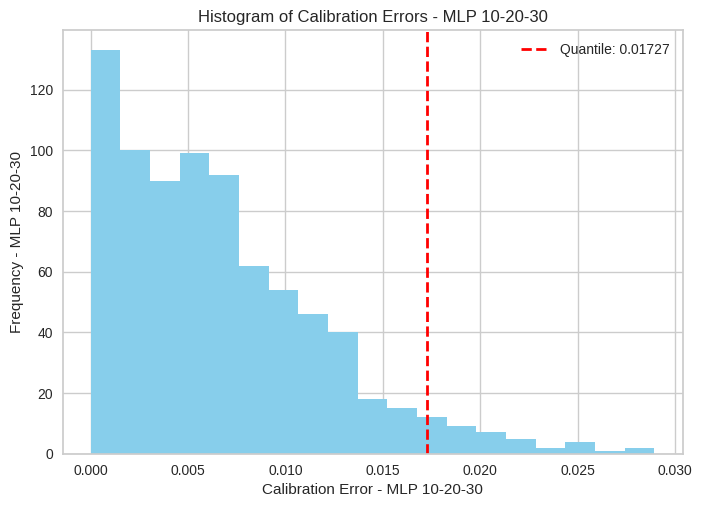

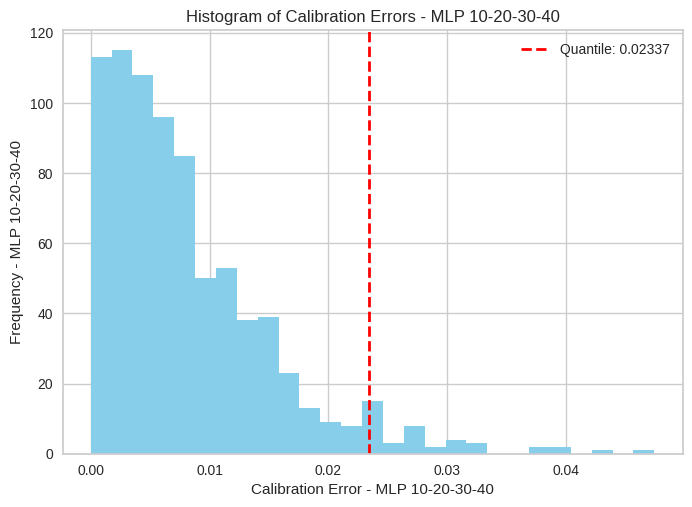

In [61]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Diretório para salvar as imagens no Google Drive
save_path = '/content/drive/MyDrive/Mestrado/imagens/Dataset01'

# Calcular os erros de calibração para cada modelo
for (name, model) in zip(model_names, models):
    y_pred_cal = model.predict(X_cal)
    y_pred_test = model.predict(X_test)
    y_cal_error = np.abs(y_cal - y_pred_cal)

    # Calcular o quantil com ajuste da amostra final para garantir a cobertura
    q_quantile = np.ceil((n_cal+1)*(1-alpha))/n_cal

    # Calcular q_hat no conjunto de calibração
    q_yhat_cal = np.quantile(y_cal_error, q_quantile)

    # Plotar o histograma
    plt.hist(y_cal_error, bins='auto', color='skyblue')

    # Adicionar uma linha vertical para o quantil
    plt.axvline(q_yhat_cal, color='red', linestyle='dashed', linewidth=2, label=f'Quantile: {q_yhat_cal:.5f}')

    # Adicionar legenda e rótulos
    plt.legend()
    plt.xlabel(f'Calibration Error - {name}')
    plt.ylabel(f'Frequency - {name}')
    plt.title(f'Histogram of Calibration Errors - {name}')

    # Salvar a figura
    save_file = os.path.join(save_path, f'{name}_calibration_error_histogram.png')
    plt.savefig(save_file, dpi=300)

    # Mostrar o gráfico
    plt.show()


In [ ]:
'''

# calculate calibraion errors
for (name, model) in zip(model_names, models):
  y_pred_cal = model.predict(X_cal)
  y_pred_test = model.predict(X_test)
  y_cal_error = np.abs(y_cal - y_pred_cal)
  # calculate quantile with final sample adjustment to ensure coverage
  np.ceil((n_cal+1)*(1-alpha))/n_cal
  #calculate q_hat on the calibration set
  q_yhat_cal = np.quantile(y_cal_error,np.ceil((n_cal+1)*(1-alpha))/n_cal)
  # Plot the histogram
  plt.hist(y_cal_error, bins='auto', color='skyblue')
  # Add a vertical line for the
  plt.axvline(q_yhat_cal, color='red', linestyle='dashed', linewidth=2, label='quantile')
  plt.legend()
  plt.xlabel(f'Calibration Error {name}')
  plt.ylabel(f'Frequency {name}')
  plt.title(f'Histogram of Calibration Errors {name}')
  plt.show()

'''

In [ ]:
'''

calculate quantile with final sample adjustment to ensure coverage
np.ceil((n_cal+1)*(1-alpha))/n_cal

'''

In [ ]:
'''
calculate q_hat on the calibration set
q_yhat_cal = np.quantile(y_cal_error,np.ceil((n_cal+1)*(1-alpha))/n_cal)
q_yhat_cal

'''

In [ ]:
'''

Plot the histogram
plt.hist(y_cal_error, bins='auto', color='skyblue')

Add a vertical line for the
plt.axvline(q_yhat_cal, color='red', linestyle='dashed', linewidth=2, label='quantile')

plt.legend()
plt.xlabel('Calibration Error')
plt.ylabel('Frequency')
plt.title('Histogram of Calibration Errors')

plt.show()

'''

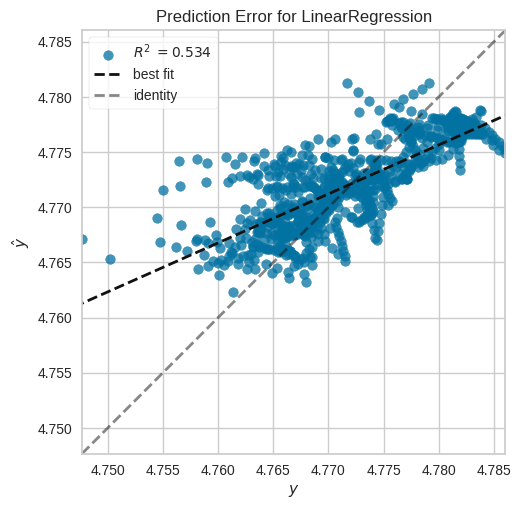

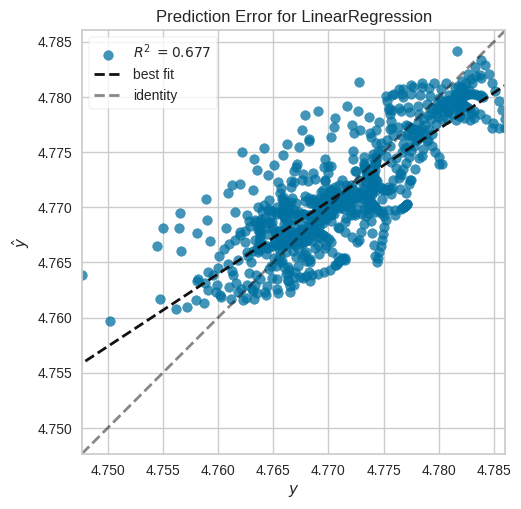

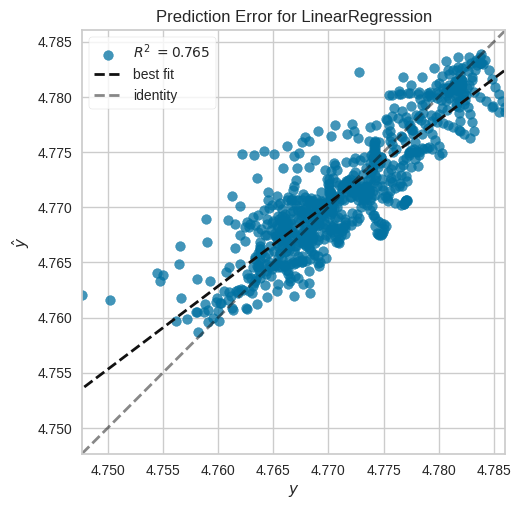

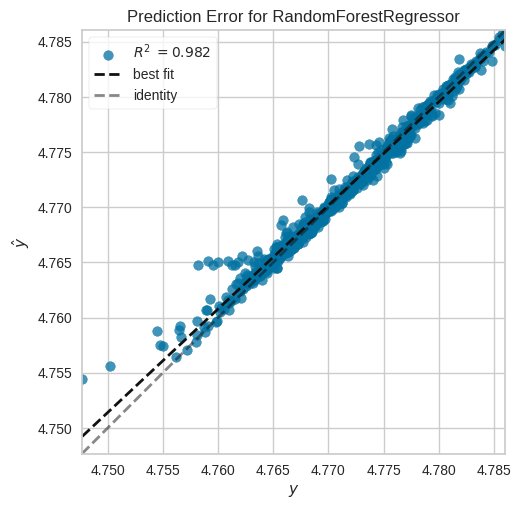

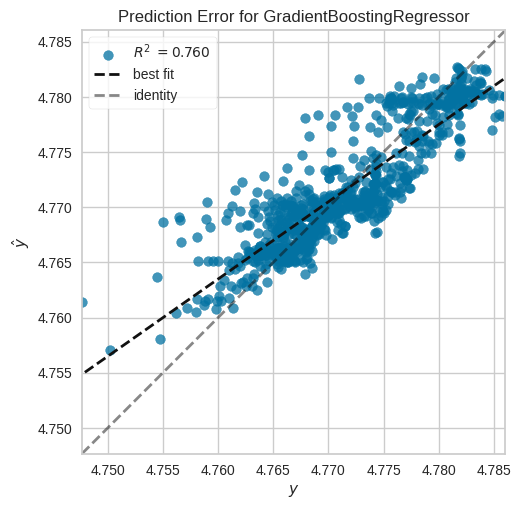

...

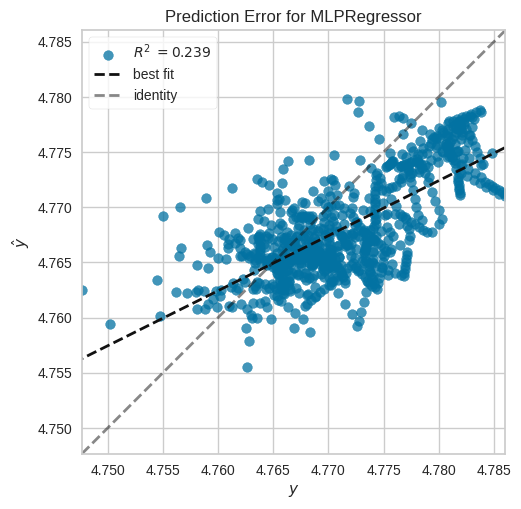

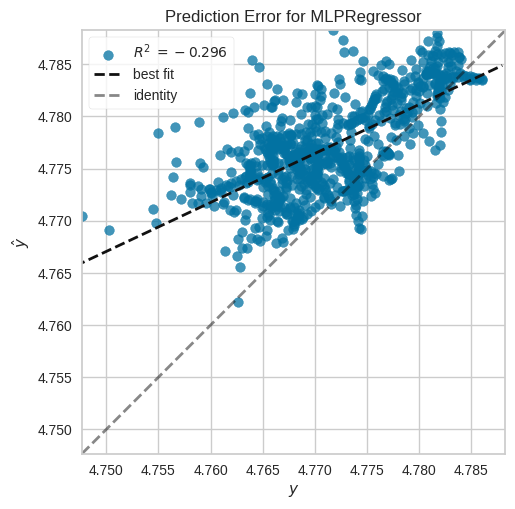

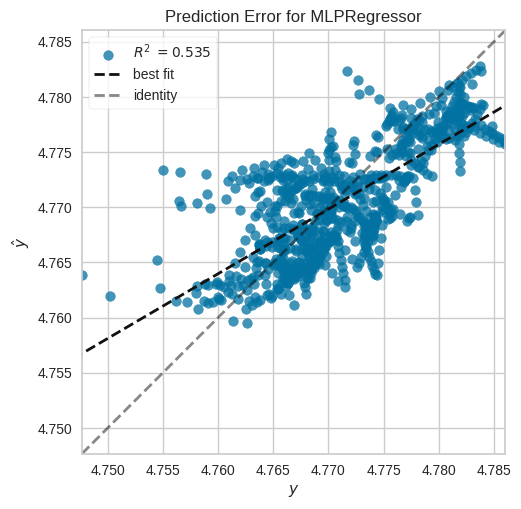

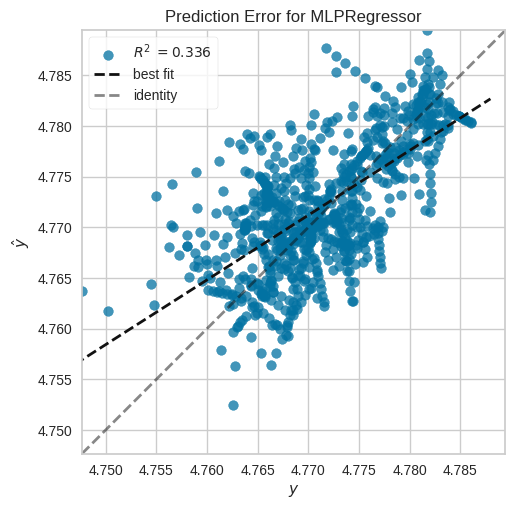

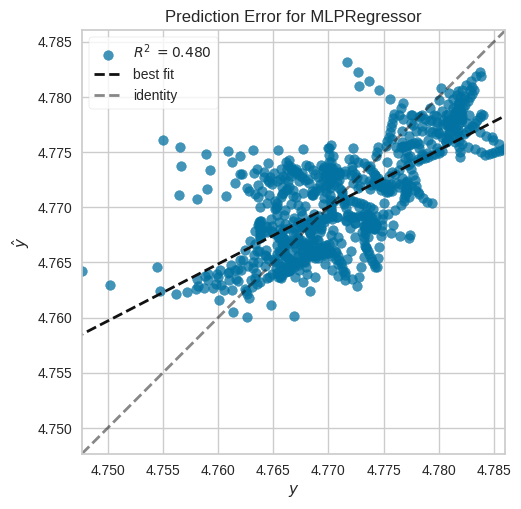

In [62]:
for (name, model) in zip(model_names, models):
  visualizer = PredictionError(model)
  visualizer.score(X_test, y_test)  # Evaluate the model on the test data
  visualizer.show()

Cobertura de Linear Regression: 0.99
Pontuação de R² para Linear Regression: 0.53


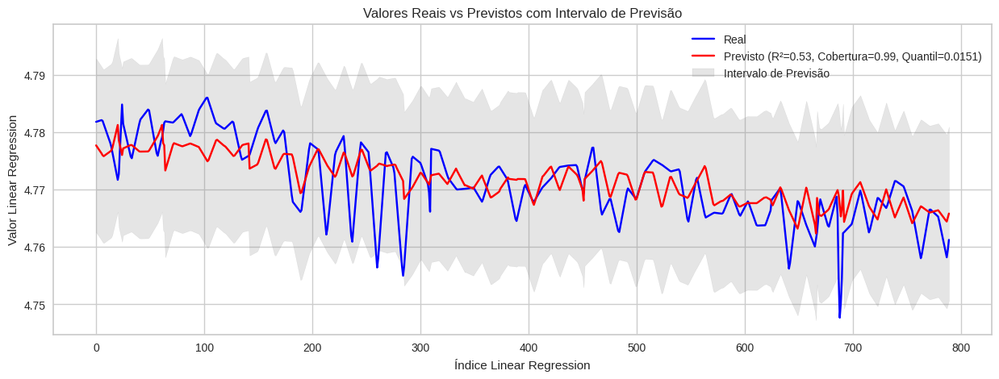

Cobertura de Linear Regression Poly1: 1.00
Pontuação de R² para Linear Regression Poly1: 0.68


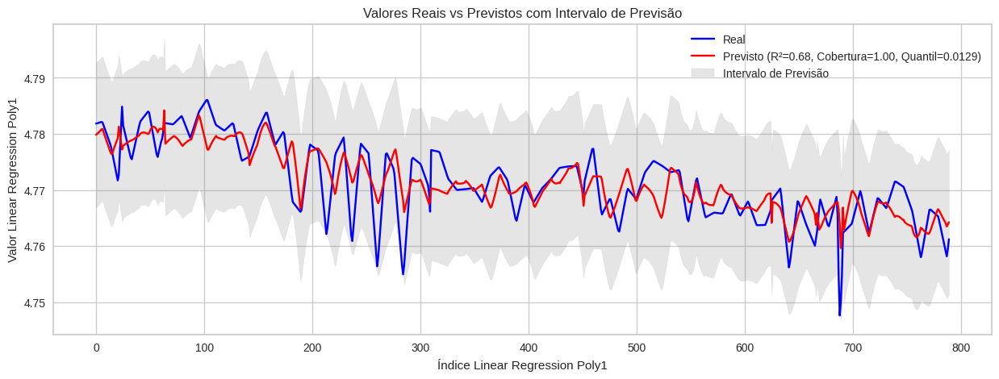

Cobertura de Linear Regression Poly2: 0.99
Pontuação de R² para Linear Regression Poly2: 0.76


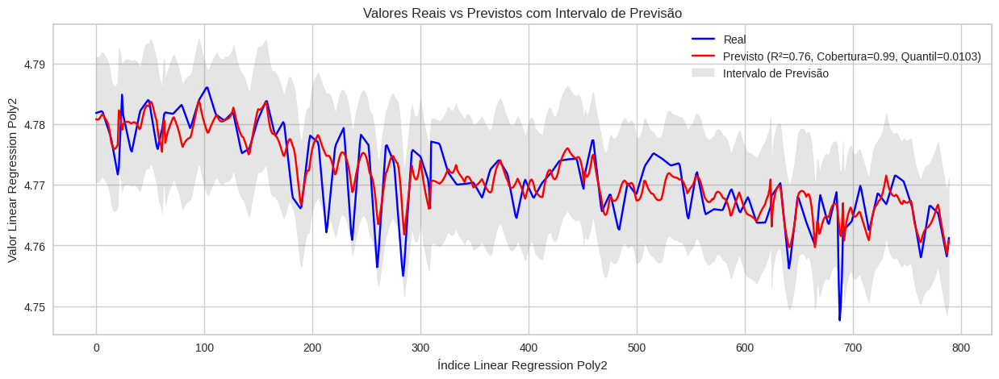

Cobertura de Random Forest: 0.99
Pontuação de R² para Random Forest: 0.98


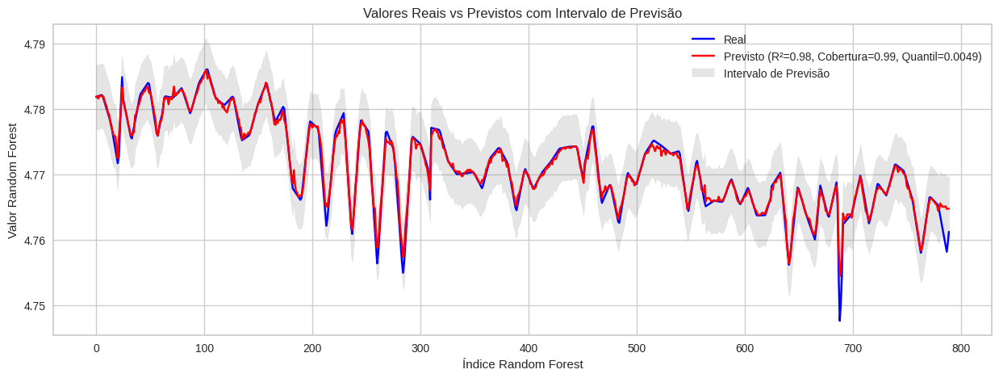

Cobertura de Gradient Boosting: 0.99
Pontuação de R² para Gradient Boosting: 0.76


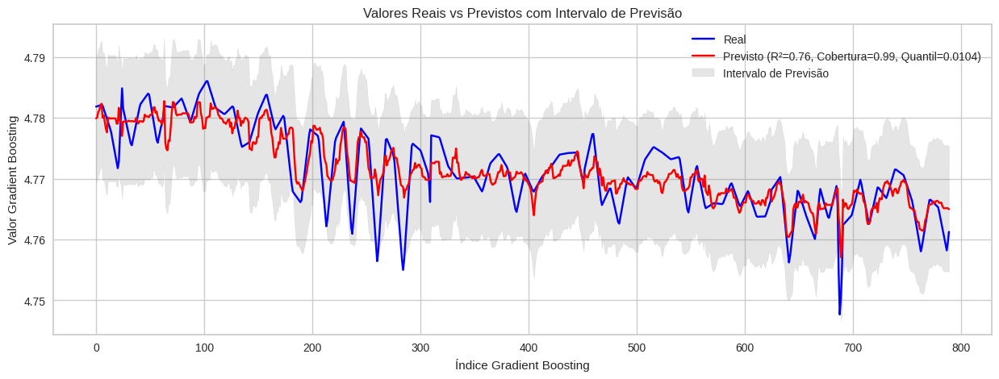

Cobertura de HistGradient Boostin: 1.00
Pontuação de R² para HistGradient Boostin: 0.92


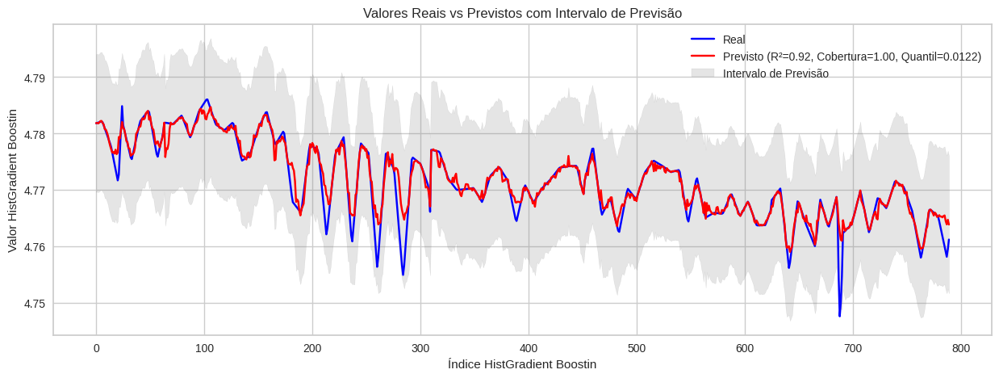

Cobertura de MLP 10-30-10: 1.00
Pontuação de R² para MLP 10-30-10: 0.49


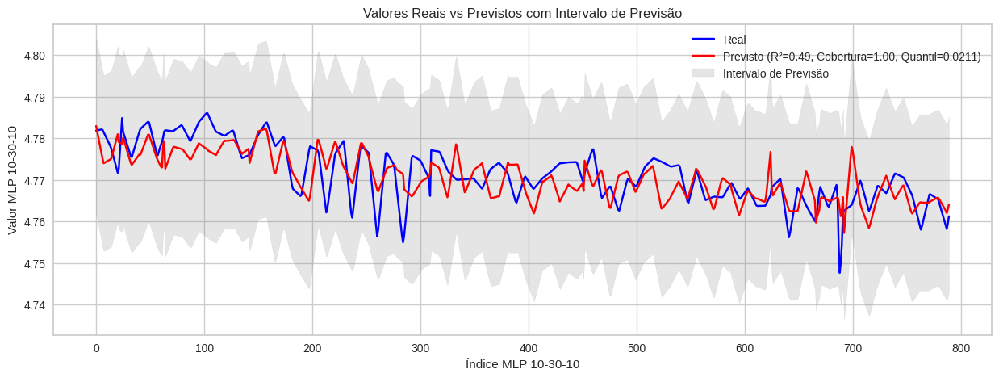

Cobertura de MLP 20-50-10: 1.00
Pontuação de R² para MLP 20-50-10: 0.24


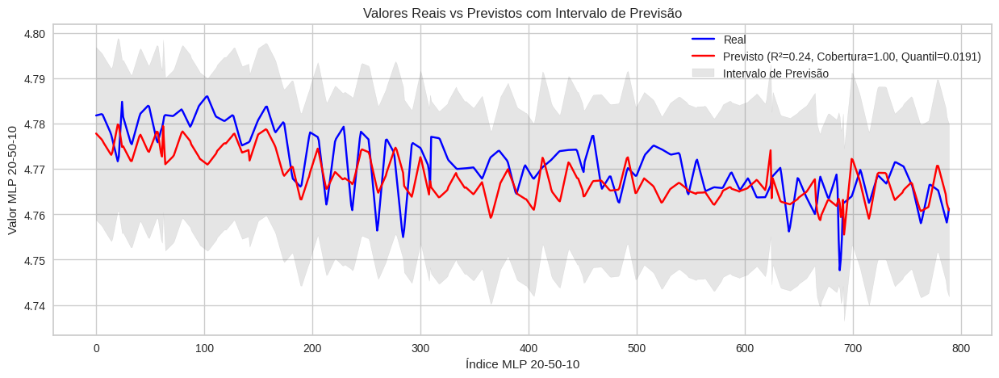

Cobertura de MLP 10-30-20: 0.98
Pontuação de R² para MLP 10-30-20: -0.30


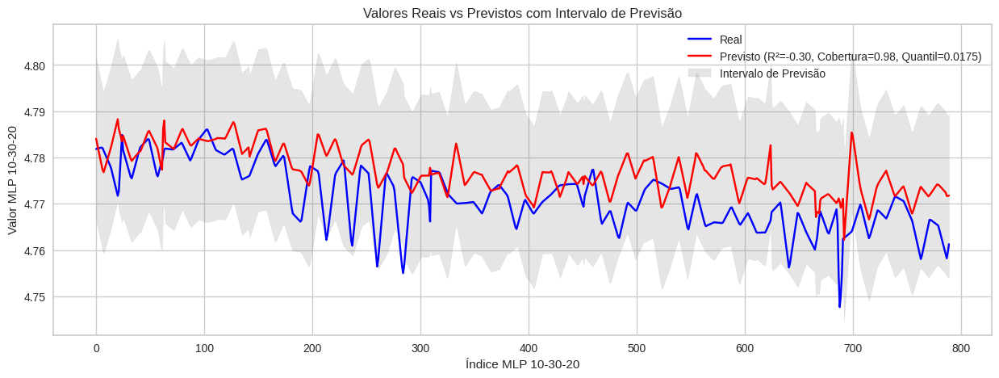

Cobertura de MLP 10-20-10: 1.00
Pontuação de R² para MLP 10-20-10: 0.53


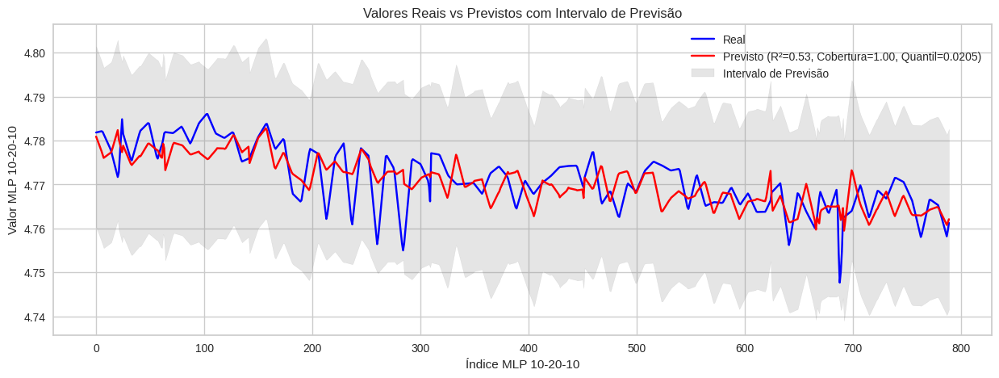

Cobertura de MLP 10-20-30: 1.00
Pontuação de R² para MLP 10-20-30: 0.34


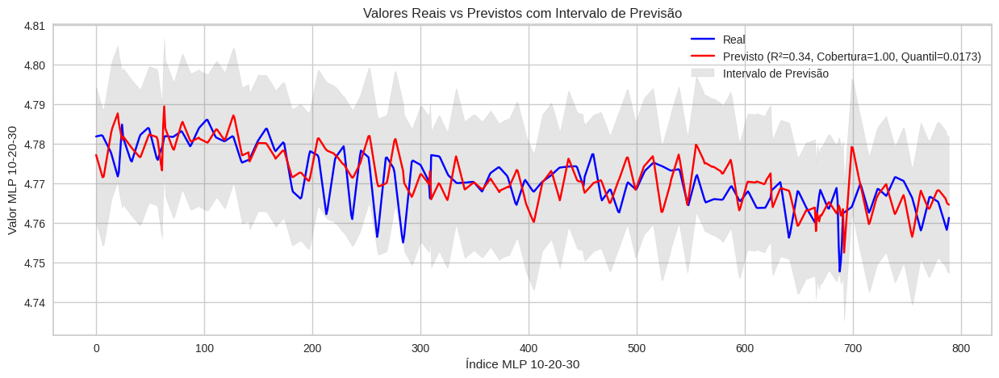

Cobertura de MLP 10-20-30-40: 1.00
Pontuação de R² para MLP 10-20-30-40: 0.48


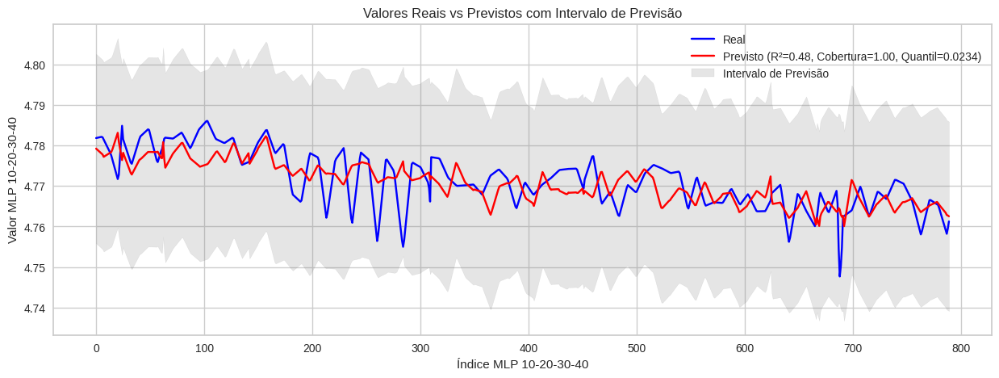

In [70]:
#Gráficos em português

import os

# Define o caminho onde os gráficos serão salvos
save_path = '/content/drive/MyDrive/Mestrado/imagens/Dataset01'

# Verifica se o diretório de salvamento existe, caso contrário, cria-o
if not os.path.exists(save_path):
    os.makedirs(save_path)

for (name, model) in zip(model_names, models):
    y_pred_cal = model.predict(X_cal)
    y_pred_test = model.predict(X_test)
    y_cal_error = np.abs(y_cal - y_pred_cal)

    # calculate quantile with final sample adjustment to ensure coverage
    np.ceil((n_cal+1)*(1-alpha))/n_cal

    # calculate q_hat on the calibration set
    q_yhat_cal = np.quantile(y_cal_error, np.ceil((n_cal+1)*(1-alpha))/n_cal)
    y_hat_test_lower = y_pred_test - q_yhat_cal
    y_hat_test_upper = y_pred_test + q_yhat_cal

    predict_df = pd.DataFrame(list(zip(y_test, y_pred_test, y_hat_test_lower, y_hat_test_upper)),
                               columns=['actual', 'predicted', 'lower_bound', 'upper_bound'])

    def calculate_coverage(df):
        df['in_interval'] = df.apply(lambda row: row['lower_bound'] <= row['actual'] <= row['upper_bound'], axis=1)
        coverage = df['in_interval'].mean()
        return coverage

    coverage = calculate_coverage(predict_df)
    print(f"Cobertura de {name}: {coverage:.2f}")

    # Calcular o valor de R^2
    r2_score_val = r2_score(y_test, y_pred_test)
    print(f"Pontuação de R² para {name}: {r2_score_val:.2f}")

    # Criar uma nova figura
    plt.figure(figsize=(15, 5))

    # Plotar valores reais
    plt.plot(predict_df['actual'], label='Real', color='blue')

    # Plotar valores previstos
    plt.plot(predict_df['predicted'], label=f'Previsto (R²={r2_score_val:.2f}, Cobertura={coverage:.2f}, Quantil={q_yhat_cal:.4f})', color='red')

    # Plotar intervalo de previsão
    plt.fill_between(predict_df.index, predict_df['lower_bound'], predict_df['upper_bound'],
                     color='gray', alpha=0.2, label='Intervalo de Previsão')

    # Adicionar a legenda
    plt.legend()

    # Definir rótulos e título
    plt.xlabel(f'Índice {name}')
    plt.ylabel(f'Valor {name}')
    plt.title('Valores Reais vs Previstos com Intervalo de Previsão')

    # Salvar o gráfico no Google Drive
    save_file = os.path.join(save_path, f'{name}_real_vs_previsto.png')
    plt.savefig(save_file, dpi=300)

    # Exibir o gráfico
    plt.show()


Linear Regression Coverage: 0.9936708860759493
Linear Regression R^2 Score: 0.5343526491045926


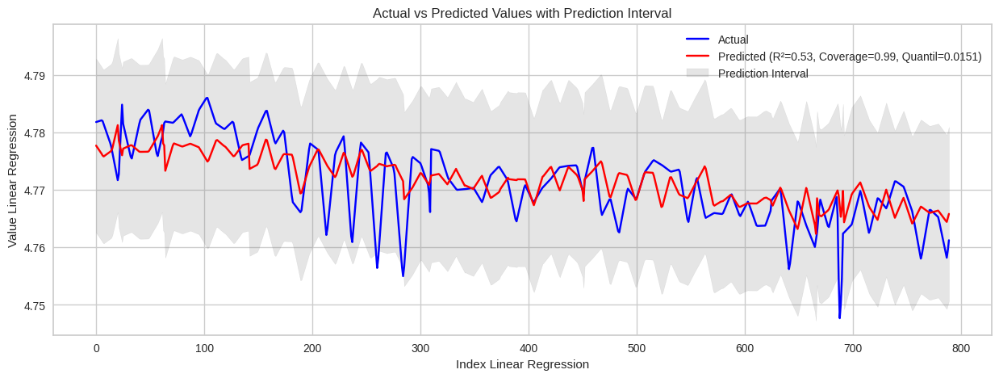

Linear Regression Poly1 Coverage: 0.9974683544303797
Linear Regression Poly1 R^2 Score: 0.6767485071547118


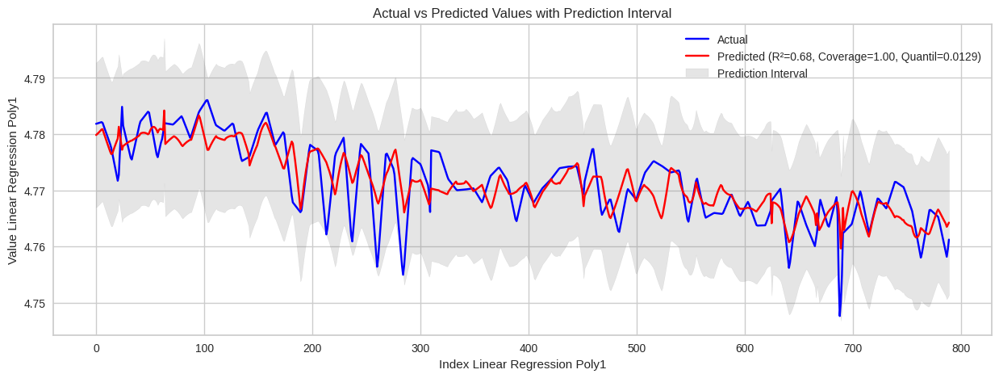

Linear Regression Poly2 Coverage: 0.9936708860759493
Linear Regression Poly2 R^2 Score: 0.7648996851740156


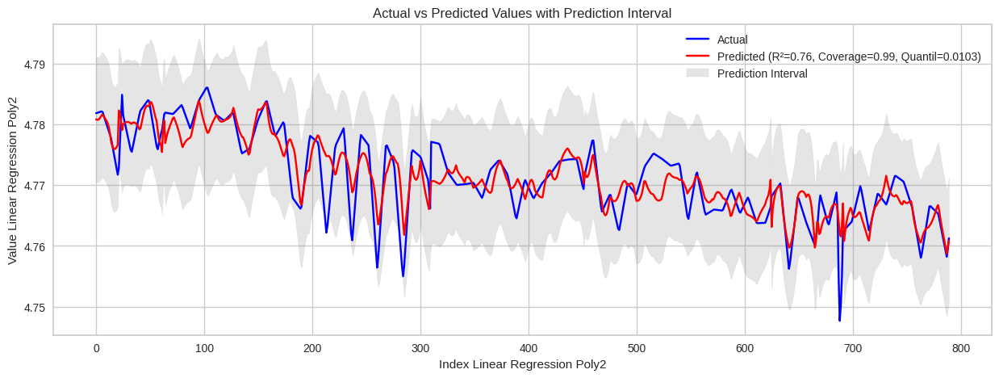

Random Forest Coverage: 0.9924050632911392
Random Forest R^2 Score: 0.9822647526197469


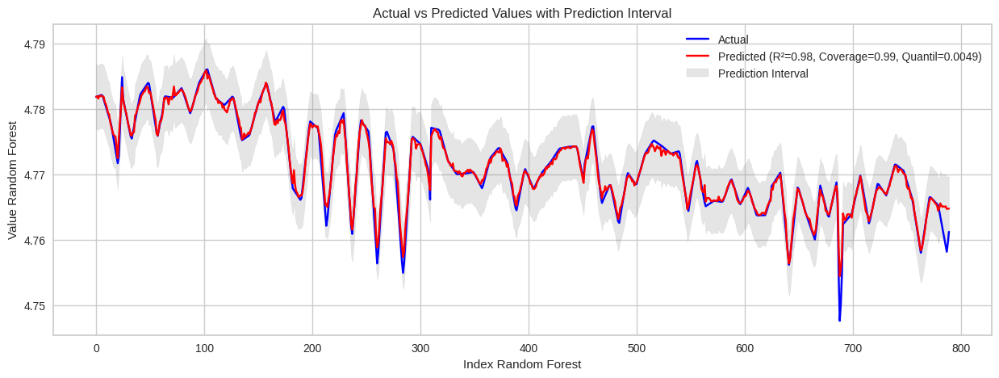

Gradient Boosting Coverage: 0.9936708860759493
Gradient Boosting R^2 Score: 0.7602071287028896


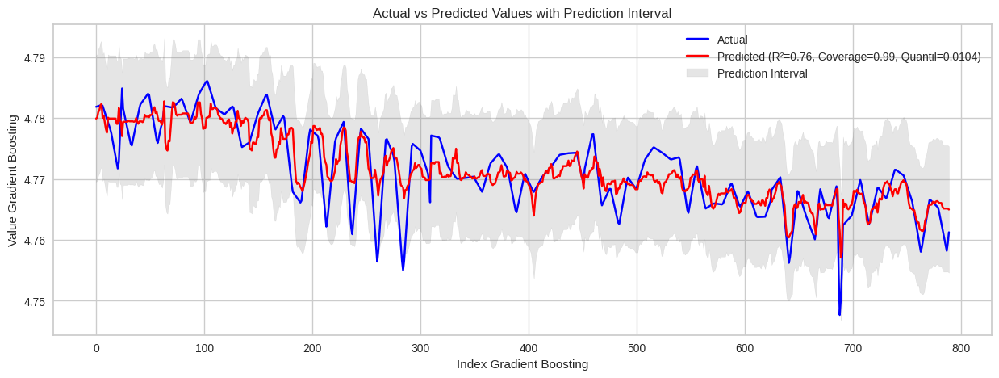

HistGradient Boostin Coverage: 0.9987341772151899
HistGradient Boostin R^2 Score: 0.9228905202828256


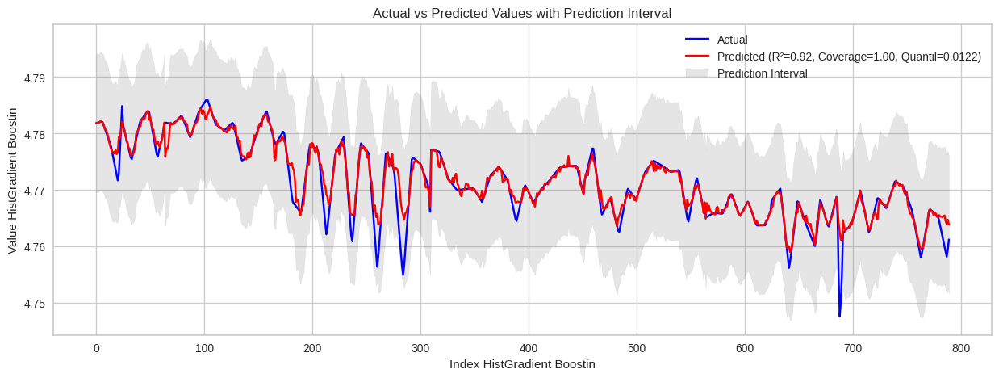

MLP 10-30-10 Coverage: 1.0
MLP 10-30-10 R^2 Score: 0.49417781345857015


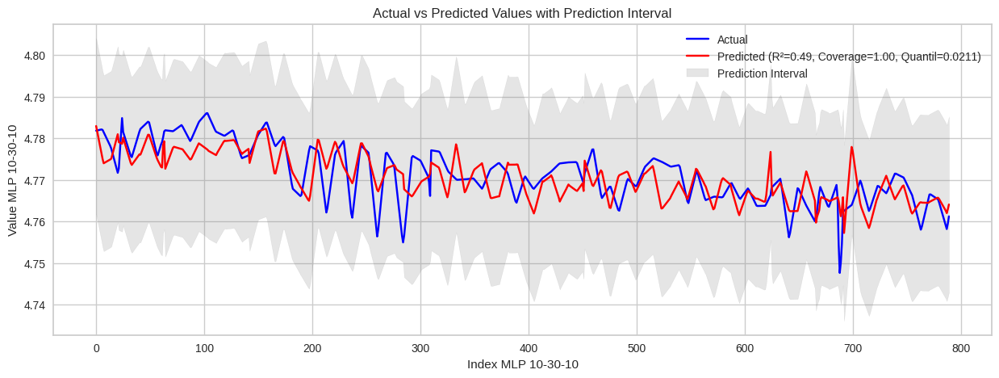

MLP 20-50-10 Coverage: 1.0
MLP 20-50-10 R^2 Score: 0.23875240539013598


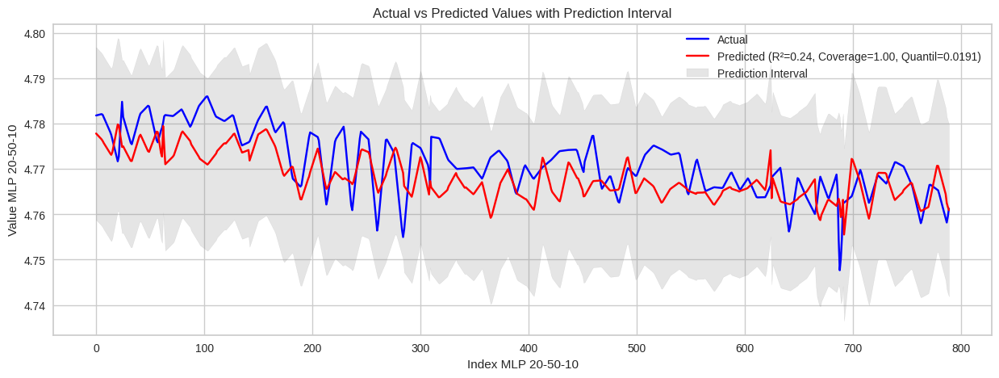

MLP 10-30-20 Coverage: 0.9835443037974684
MLP 10-30-20 R^2 Score: -0.2958504511375466


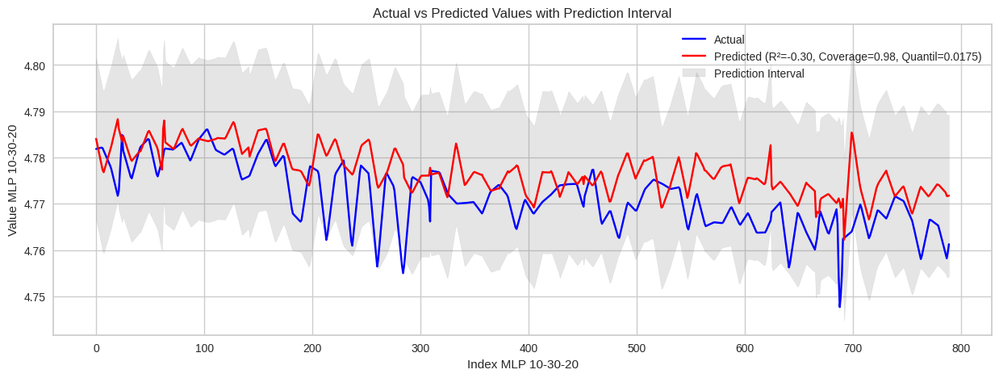

MLP 10-20-10 Coverage: 1.0
MLP 10-20-10 R^2 Score: 0.534761765773492


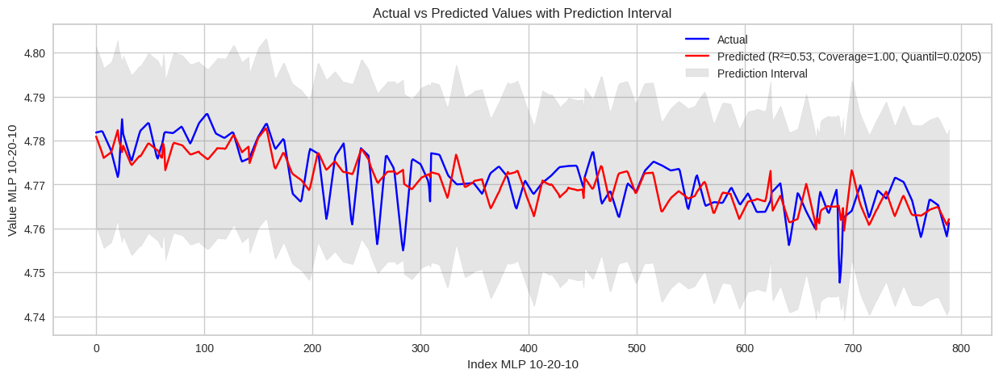

MLP 10-20-30 Coverage: 0.9974683544303797
MLP 10-20-30 R^2 Score: 0.33567821156243594


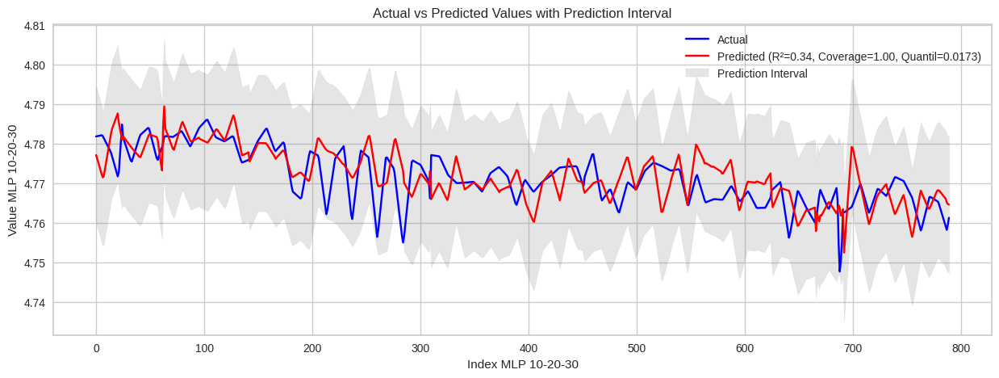

MLP 10-20-30-40 Coverage: 1.0
MLP 10-20-30-40 R^2 Score: 0.47987803115957794


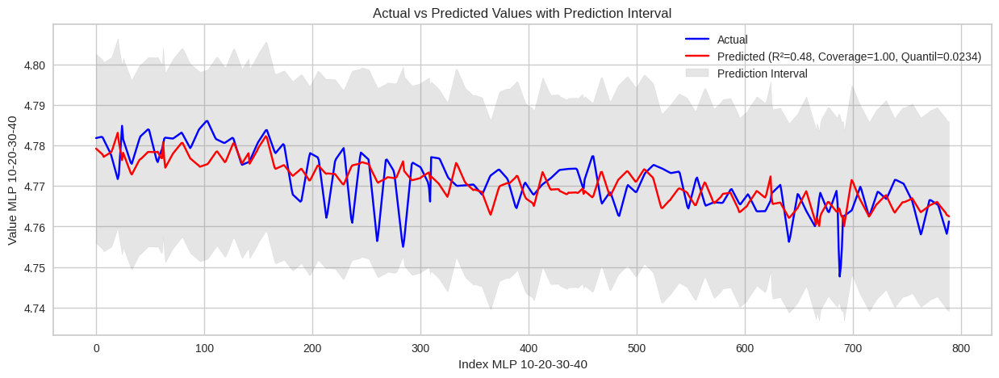

In [71]:
import os

# Define o caminho onde os gráficos serão salvos
save_path = '/content/drive/MyDrive/Mestrado/imagens/Dataset01'

# Verifica se o diretório de salvamento existe, caso contrário, cria-o
if not os.path.exists(save_path):
    os.makedirs(save_path)

for (name, model) in zip(model_names, models):
    y_pred_cal = model.predict(X_cal)
    y_pred_test = model.predict(X_test)
    y_cal_error = np.abs(y_cal - y_pred_cal)

    # calculate quantile with final sample adjustment to ensure coverage
    np.ceil((n_cal+1)*(1-alpha))/n_cal

    # calculate q_hat on the calibration set
    q_yhat_cal = np.quantile(y_cal_error, np.ceil((n_cal+1)*(1-alpha))/n_cal)
    y_hat_test_lower = y_pred_test - q_yhat_cal
    y_hat_test_upper = y_pred_test + q_yhat_cal

    predict_df = pd.DataFrame(list(zip(y_test, y_pred_test, y_hat_test_lower, y_hat_test_upper)),
                               columns=['actual', 'predicted', 'lower_bound', 'upper_bound'])

    def calculate_coverage(df):
        df['in_interval'] = df.apply(lambda row: row['lower_bound'] <= row['actual'] <= row['upper_bound'], axis=1)
        coverage = df['in_interval'].mean()
        return coverage

    coverage = calculate_coverage(predict_df)
    print(f"{name} Coverage: {coverage}")

    # Calculate R^2 score
    r2_score_val = r2_score(y_test, y_pred_test)
    print(f"{name} R^2 Score: {r2_score_val}")

    # Create a new figure
    plt.figure(figsize=(15, 5))

    # Plot actual values
    plt.plot(predict_df['actual'], label='Actual', color='blue')

    # Plot predicted values
    plt.plot(predict_df['predicted'], label=f'Predicted (R²={r2_score_val:.2f}, Coverage={coverage:.2f}, Quantil={q_yhat_cal:.4f})', color='red')

    # Plot prediction intervals
    plt.fill_between(predict_df.index, predict_df['lower_bound'], predict_df['upper_bound'],
                     color='gray', alpha=0.2, label='Prediction Interval')

    # Add the legend
    plt.legend()

    # Set labels and title
    plt.xlabel(f'Index {name}')
    plt.ylabel(f'Value {name}')
    plt.title('Actual vs Predicted Values with Prediction Interval')

    # Salva o gráfico no Google Drive
    save_file = os.path.join(save_path, f'{name}_actual_vs_predicted.png')
    plt.savefig(save_file, dpi=300)

    # Show the plot
    plt.show()


In [ ]:
'''
# Código mais próximo do original

for (name, model) in zip(model_names, models):
    y_pred_cal = model.predict(X_cal)
    y_pred_test = model.predict(X_test)
    y_cal_error = np.abs(y_cal - y_pred_cal)
    # calculate quantile with final sample adjustment to ensure coverage
    np.ceil((n_cal+1)*(1-alpha))/n_cal
    #calculate q_hat on the calibration set
    q_yhat_cal = np.quantile(y_cal_error,np.ceil((n_cal+1)*(1-alpha))/n_cal)
    y_hat_test_lower = y_pred_test - q_yhat_cal
    y_hat_test_upper = y_pred_test + q_yhat_cal

    predict_df = pd.DataFrame(list(zip(y_test,y_pred_test,y_hat_test_lower,y_hat_test_upper)),
                            columns=['actual','predicted','lower_bound','upper_bound'])
    predict_df

    def calculate_coverage(df):
      df['in_interval'] = df.apply(lambda row: row['lower_bound'] <= row['actual'] <= row['upper_bound'], axis=1)
      coverage = df['in_interval'].mean()
      return coverage

    coverage = calculate_coverage(predict_df)
    print(f"{name} Coverage: {coverage}")

    # Sort DataFrame by 'actual' values for smooth line plots
    #predict_df = predict_df.sort_values('actual').reset_index(drop=True)

    # Create a new figure
    plt.figure(figsize=(15, 5))

    # Plot actual values
    plt.plot(predict_df['actual'], label='Actual', color='blue')

    # Plot predicted values
    plt.plot(predict_df['predicted'], label='Predicted', color='red')

    # Plot prediction intervals
    plt.fill_between(predict_df.index, predict_df['lower_bound'], predict_df['upper_bound'],
                    color='gray', alpha=0.2, label='Prediction Interval')

    # Add the legend
    plt.legend()

    # Set labels and title
    plt.xlabel(f'Index {name}')
    plt.ylabel(f'Value {name}')
    plt.title(f'Actual vs Predicted Values with Prediction Interval {name}')

    # Show the plot
    plt.show()
'''